In [ ]:
!pip uninstall numpy -y
!pip install numpy==1.23.5

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 112.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.89 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.23.5 which is incompatible.
numba 0.61.2 requires numpy<2.3,>=1.24, but you have numpy 1.23.5 which is incompatible.
scikit-image 0.25.2 requires numpy>=1.24, but you have numpy 1.23.5 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.23.5 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.23.5 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)

# Pre Processing

## 1. Importing Libraries and Reading Data

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

In [ ]:
import pandas as pd

csv_path ="/content/drive/MyDrive/Final_Group2/city_temperature.csv"
df = pd.read_csv(csv_path)
df[['Month', 'Day', 'Year']] = df[['Month', 'Day', 'Year']].astype(int)
df.to_csv(csv_path, index=False)
print(df.head())

<ipython-input-4-14ca26c06b05>:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


   Region  Country State     City  Month  Day  Year  AvgTemperature
0  Africa  Algeria   NaN  Algiers      1    1  1995            64.2
1  Africa  Algeria   NaN  Algiers      1    2  1995            49.4
2  Africa  Algeria   NaN  Algiers      1    3  1995            48.8
3  Africa  Algeria   NaN  Algiers      1    4  1995            46.4
4  Africa  Algeria   NaN  Algiers      1    5  1995            47.9


## 2. Data Analysis

In [ ]:
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2906327 entries, 0 to 2906326
Data columns (total 8 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Region          object 
 1   Country         object 
 2   State           object 
 3   City            object 
 4   Month           int64  
 5   Day             int64  
 6   Year            int64  
 7   AvgTemperature  float64
dtypes: float64(1), int64(3), object(4)
memory usage: 177.4+ MB


,Month,Day,Year,AvgTemperature
count,2.906327e+06,2.906327e+06,2.906327e+06,2.906327e+06
mean,6.469163e+00,1.571682e+01,2.006624e+03,5.600492e+01
std,3.456489e+00,8.800534e+00,2.338226e+01,3.212359e+01
min,1.000000e+00,0.000000e+00,2.000000e+02,-9.900000e+01
25%,3.000000e+00,8.000000e+00,2.001000e+03,4.580000e+01
50%,6.000000e+00,1.600000e+01,2.007000e+03,6.250000e+01
75%,9.000000e+00,2.300000e+01,2.013000e+03,7.550000e+01
max,1.200000e+01,3.100000e+01,2.020000e+03,1.100000e+02


In [ ]:
missing_values = df.isnull().sum()
missing_values = missing_values[missing_values > 0]
print("Columns with missing values:")
print(missing_values)

Columns with missing values:
State    1450990
dtype: int64


## 3. Exploratory Data Analysis

In [ ]:
unique_regions = df['Region'].unique()
unique_countries = df['Country'].unique()

unique_values_df = pd.DataFrame({
    "Unique Regions": pd.Series(unique_regions),
    "Unique Countries": pd.Series(unique_countries)
})

print("Unique Regions:", unique_regions)
print("\nUnique Countries:", unique_countries)

Unique Regions: ['Africa' 'Asia' 'Australia/South Pacific' 'Europe' 'Middle East'
 'North America' 'South/Central America & Carribean']

Unique Countries: ['Algeria' 'Burundi' 'Benin' 'Central African Republic' 'Congo' 'Egypt'
 'Ethiopia' 'Gabon' 'Gambia' 'Guinea' 'Guinea-Bissau' 'Ivory Coast'
 'Kenya' 'Morocco' 'Madagascar' 'Mauritania' 'Malawi' 'Mozambique'
 'Namibia' 'Nigeria' 'Senegal' 'Sierra Leone' 'South Africa' 'Togo'
 'Tunisia' 'Tanzania' 'Uganda' 'Zambia' 'Bangladesh' 'China' 'Hong Kong'
 'India' 'Indonesia' 'Japan' 'Kazakhstan' 'Kyrgyzstan' 'Laos' 'Malaysia'
 'Mongolia' 'Myanmar (Burma)' 'Nepal' 'North Korea' 'Pakistan'
 'Philippines' 'Singapore' 'South Korea' 'Sri Lanka' 'Taiwan' 'Tajikistan'
 'Thailand' 'Turkmenistan' 'Uzbekistan' 'Vietnam' 'Australia'
 'New Zealand' 'Albania' 'Austria' 'Belarus' 'Belgium' 'Bulgaria'
 'Croatia' 'Cyprus' 'Czech Republic' 'Denmark' 'Finland' 'France'
 'Germany' 'Georgia' 'Greece' 'Hungary' 'Iceland' 'Ireland' 'Italy'
 'Latvia' 'Macedonia' 'T

In [ ]:
unique_values_df

,Unique Regions,Unique Countries
0,Africa,Algeria
1,Asia,Burundi
2,Australia/South Pacific,Benin
3,Europe,Central African Republic
4,Middle East,Congo
...,...,...
120,NaN,Peru
121,NaN,Suriname
122,NaN,Uruguay
123,NaN,Venezuela


In [ ]:
north_america = df[df['Region'] == "North America"]
us = north_america[north_america['Country'] == "US"]

us.to_csv("/content/drive/MyDrive/Final_Group2/filtered_data1.csv", index=False)

In [ ]:
missing_values_na = us.isnull().sum()
dataset_size = us.shape

print("Missing Values in United States Data:")
print(missing_values_na)

print("\nDataset size (rows, columns):", dataset_size)

print("\nFirst 5 rows of North America Data:")
us.head()

Missing Values in United States Data:
Region            0
Country           0
State             0
City              0
Month             0
Day               0
Year              0
AvgTemperature    0
dtype: int64

Dataset size (rows, columns): (1455337, 8)

First 5 rows of North America Data:


,Region,Country,State,City,Month,Day,Year,AvgTemperature
1450990,North America,US,Alabama,Birmingham,1,1,1995,50.7
1450991,North America,US,Alabama,Birmingham,1,2,1995,37.2
1450992,North America,US,Alabama,Birmingham,1,3,1995,33.2
1450993,North America,US,Alabama,Birmingham,1,4,1995,33.3
1450994,North America,US,Alabama,Birmingham,1,5,1995,26.4


In [ ]:
unique_states = us['State'].unique()
unique_cities = us['City'].unique()

unique_values_df = pd.DataFrame({
    "Unique States": pd.Series(unique_states),
    "Unique Cities": pd.Series(unique_cities)
})

print("Unique States:")
print(unique_states)
print("\nUnique Cities:")
print(unique_cities)

state_count = len(unique_states)
city_count = len(unique_cities)
print(f"\nTotal unique states: {state_count}")
print(f"Total unique cities: {city_count}")

Unique States:
['Alabama' 'Alaska' 'Arizona' 'Arkansas' 'California' 'Colorado'
 'Connecticut' 'Delaware' 'District of Columbia' 'Maryland' 'Florida'
 'Georgia' 'Hawaii' 'Idaho' 'Illinois' 'Indiana' 'Iowa' 'Kansas'
 'Kentucky' 'Louisiana' 'Maine' 'Massachusetts' 'Michigan' 'Minnesota'
 'Mississippi' 'Missouri' 'Montana' 'Nebraska' 'Nevada' 'New Hampshire'
 'New Jersey' 'New Mexico' 'New York' 'North Carolina' 'North Dakota'
 'Ohio' 'Oklahoma' 'Oregon' 'Pennsylvania' 'Rhode Island' 'South Carolina'
 'South Dakota' 'Tennessee' 'Texas' 'Utah' 'Vermont' 'Virginia'
 'Washington' 'West Virginia' 'Wisconsin' 'Wyoming'
 'Additional Territories']

Unique Cities:
['Birmingham' 'Huntsville' 'Mobile' 'Montgomery' 'Anchorage' 'Fairbanks'
 'Juneau' 'Flagstaff' 'Phoenix' 'Tucson' 'Yuma' 'Fort Smith' 'Little Rock'
 'Fresno' 'Los Angeles' 'Sacramento' 'San Diego' 'San Francisco'
 'Colorado Springs' 'Denver' 'Grand Junction' 'Pueblo' 'Bridgeport'
 'Hartford Springfield' 'Wilmington' 'Washington' 'Washin

In [ ]:
pip install missingno

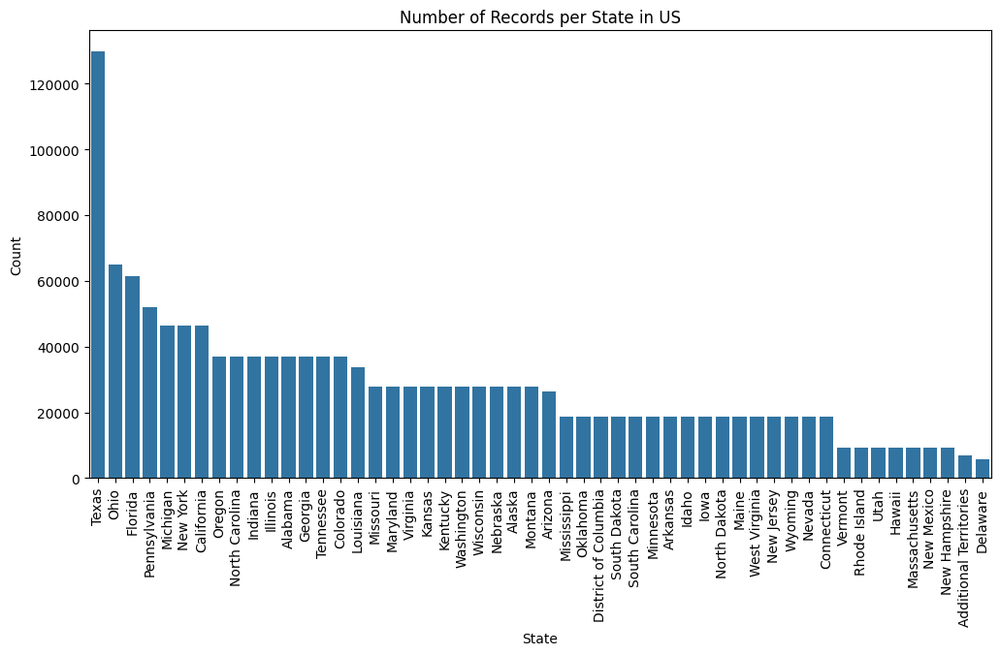

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x=us['State'].value_counts().index, y=us['State'].value_counts().values)
plt.xticks(rotation=90)
plt.title("Number of Records per State in US")
plt.xlabel("State")
plt.ylabel("Count")
plt.show()

## 4. Data Pre-Processing

In [ ]:
us["Date"] = pd.to_datetime(us[["Year", "Month", "Day"]], errors="coerce")

us = us.dropna(subset=["Date"])
# us.set_index('Date', inplace=True)
us.head()

<ipython-input-14-0737976725d3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  us["Date"] = pd.to_datetime(us[["Year", "Month", "Day"]], errors="coerce")


,Region,Country,State,City,Month,Day,Year,AvgTemperature,Date
1450990,North America,US,Alabama,Birmingham,1,1,1995,50.7,1995-01-01
1450991,North America,US,Alabama,Birmingham,1,2,1995,37.2,1995-01-02
1450992,North America,US,Alabama,Birmingham,1,3,1995,33.2,1995-01-03
1450993,North America,US,Alabama,Birmingham,1,4,1995,33.3,1995-01-04
1450994,North America,US,Alabama,Birmingham,1,5,1995,26.4,1995-01-05


#### 4.1 Handling Missing Values

In [ ]:
missing_values = us.isnull().sum()
print("Missing values:\n", missing_values)

Missing values:
 Region            0
Country           0
State             0
City              0
Month             0
Day               0
Year              0
AvgTemperature    0
Date              0
dtype: int64


#### 4.2 Convert Date Fields to Proper Format

In [ ]:
print(us.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1455337 entries, 1450990 to 2906326
Data columns (total 9 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   Region          1455337 non-null  object        
 1   Country         1455337 non-null  object        
 2   State           1455337 non-null  object        
 3   City            1455337 non-null  object        
 4   Month           1455337 non-null  int64         
 5   Day             1455337 non-null  int64         
 6   Year            1455337 non-null  int64         
 7   AvgTemperature  1455337 non-null  float64       
 8   Date            1455337 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(3), object(4)
memory usage: 111.0+ MB
None


#### 4.3 Handling Outliers

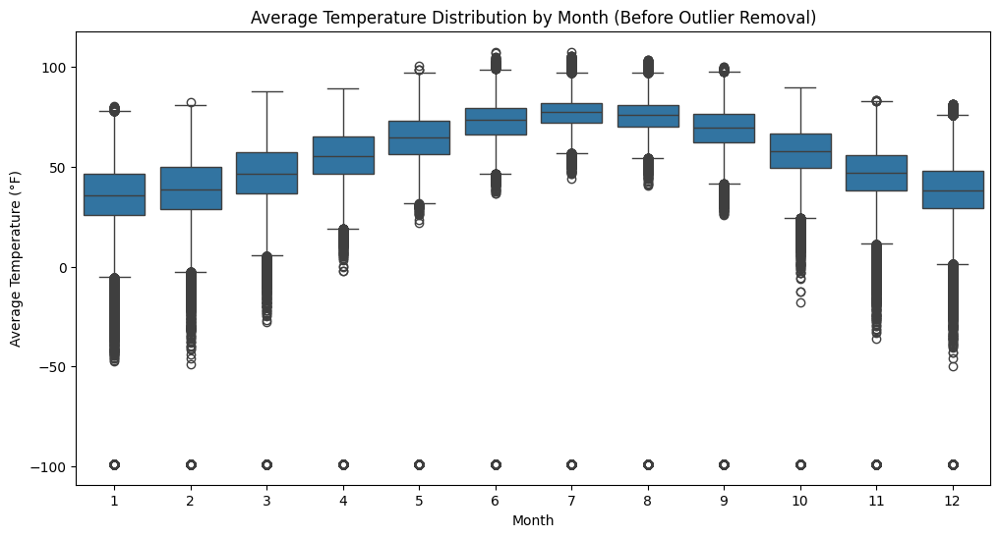

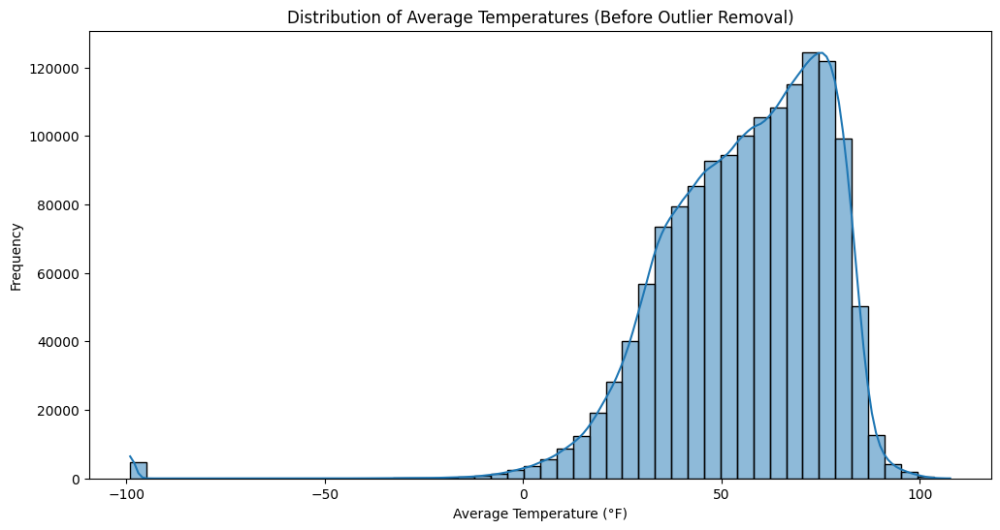

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.boxplot(x='Month', y='AvgTemperature', data=us)
plt.title("Average Temperature Distribution by Month (Before Outlier Removal)")
plt.xlabel("Month")
plt.ylabel("Average Temperature (°F)")
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(us['AvgTemperature'], bins=50, kde=True)
plt.title("Distribution of Average Temperatures (Before Outlier Removal)")
plt.xlabel("Average Temperature (°F)")
plt.ylabel("Frequency")
plt.show()


In [ ]:
#IQR Method
Q1 = us['AvgTemperature'].quantile(0.25)
Q3 = us['AvgTemperature'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

us = us[(us['AvgTemperature'] >= lower_bound) & (us['AvgTemperature'] <= upper_bound)]

In [ ]:
print("Dataset size after removing outliers:", us.shape)
print(us.describe())

Dataset size after removing outliers: (1445875, 9)
              Month           Day          Year  AvgTemperature  \
count  1.445875e+06  1.445875e+06  1.445875e+06    1.445875e+06   
mean   6.473910e+00  1.571161e+01  2.007076e+03    5.684818e+01   
min    1.000000e+00  1.000000e+00  1.995000e+03   -1.300000e+00   
25%    3.000000e+00  8.000000e+00  2.001000e+03    4.320000e+01   
50%    6.000000e+00  1.600000e+01  2.007000e+03    5.890000e+01   
75%    9.000000e+00  2.300000e+01  2.013000e+03    7.230000e+01   
max    1.200000e+01  3.100000e+01  2.020000e+03    1.077000e+02   
std    3.449951e+00  8.798506e+00  7.309810e+00    1.867418e+01   

                                Date  
count                        1445875  
mean   2007-07-28 08:01:40.250988800  
min              1995-01-01 00:00:00  
25%              2001-04-01 00:00:00  
50%              2007-06-30 00:00:00  
75%              2013-11-15 00:00:00  
max              2020-05-13 00:00:00  
std                              

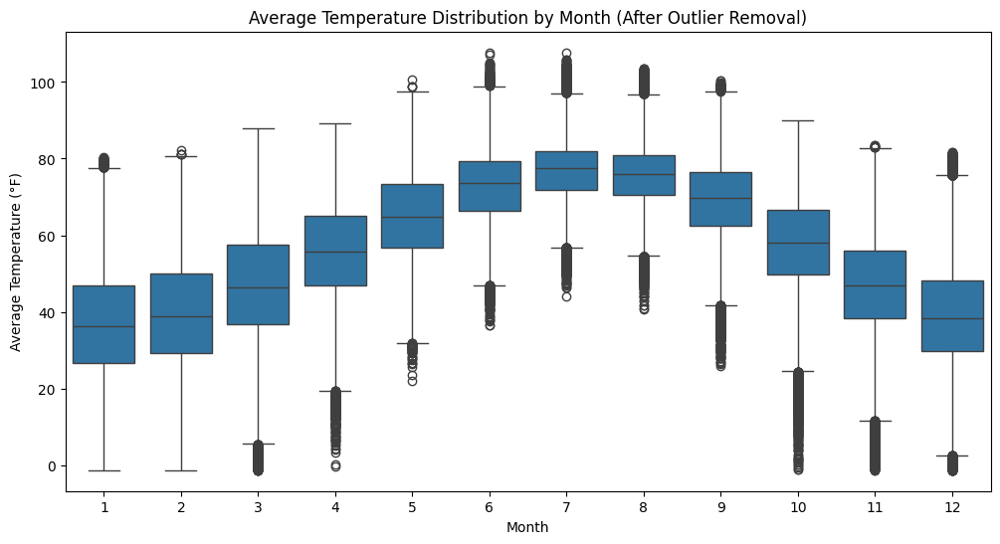

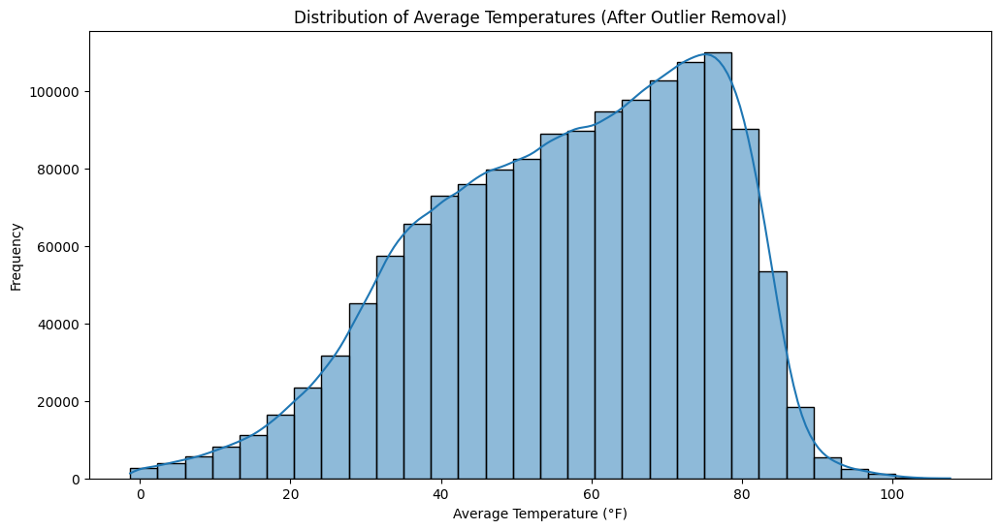

In [ ]:
#After outlier removal
plt.figure(figsize=(12, 6))
sns.boxplot(x='Month', y='AvgTemperature', data=us)
plt.title("Average Temperature Distribution by Month (After Outlier Removal)")
plt.xlabel("Month")
plt.ylabel("Average Temperature (°F)")
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(us['AvgTemperature'], bins=30, kde=True)
plt.title("Distribution of Average Temperatures (After Outlier Removal)")
plt.xlabel("Average Temperature (°F)")
plt.ylabel("Frequency")
plt.show()


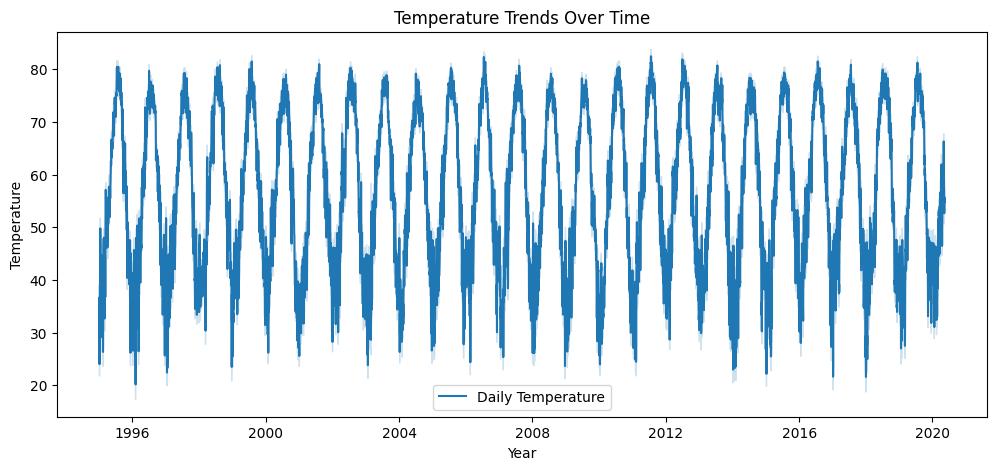

In [ ]:
# Time Series Plot
plt.figure(figsize=(12, 5))
sns.lineplot(x=us["Date"], y=us["AvgTemperature"], label="Daily Temperature")
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trends Over Time")
plt.legend()
plt.show()

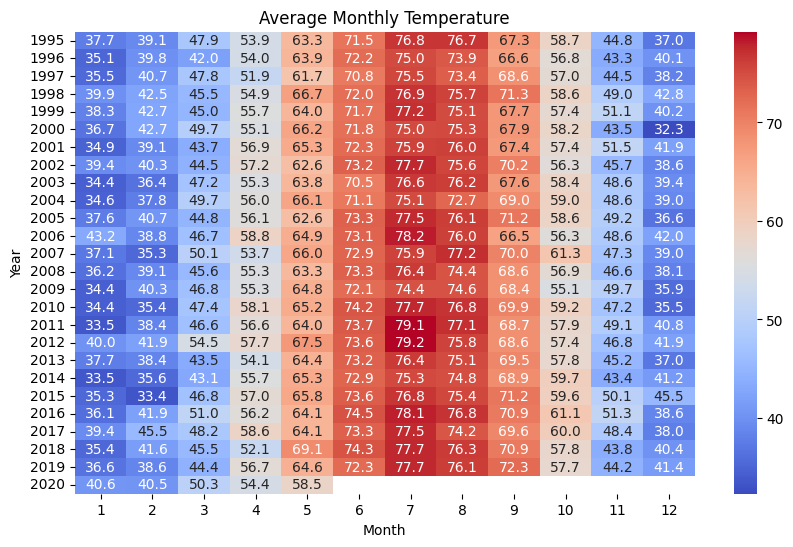

In [ ]:
# Heatmap (Year-Month Temperature Patterns)
pivot_table = us.pivot_table(values="AvgTemperature", index="Year", columns="Month", aggfunc="mean")
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, cmap="coolwarm", annot=True, fmt=".1f")
plt.xlabel("Month")
plt.ylabel("Year")
plt.title("Average Monthly Temperature")
plt.show()

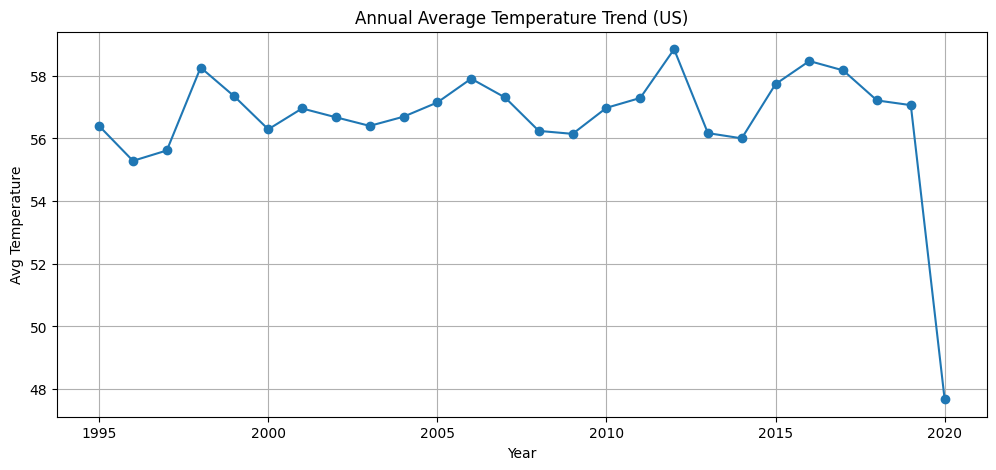

In [ ]:
# Annual Avg Temp Trend
plt.figure(figsize=(12,5))
us_yearly = us.groupby(us['Year'])['AvgTemperature'].mean()
us_yearly.plot(marker='o', linestyle='-')
plt.title("Annual Average Temperature Trend (US)")
plt.xlabel("Year")
plt.ylabel("Avg Temperature")
plt.grid(True)
plt.show()

#### 4.4 Feature Engineering

##### 4.4.1 Temporal Features


In [ ]:
us = us.sort_values(by="Date")

#Lag Features
us["Temp_Lag_1"] = us["AvgTemperature"].shift(1)
us["Temp_Lag_7"] = us["AvgTemperature"].shift(7)
us["Temp_Lag_30"] = us["AvgTemperature"].shift(30)
#Rolling features
us["Rolling_7"] = us["AvgTemperature"].rolling(window=7, min_periods=1).mean()
us["Rolling_30"] = us["AvgTemperature"].rolling(window=30, min_periods=1).mean()


In [ ]:
print(us[['AvgTemperature', 'Temp_Lag_1', 'Temp_Lag_7', 'Temp_Lag_30']].head(35))

         AvgTemperature  Temp_Lag_1  Temp_Lag_7  Temp_Lag_30
1450990            50.7        50.7        50.7         50.7
2310093            35.2        50.7        50.7         50.7
2603059            47.6        35.2        50.7         50.7
2319358            47.4        47.6        50.7         50.7
2328623            41.9        47.4        50.7         50.7
2853215            20.6        41.9        50.7         50.7
1607184            12.9        20.6        50.7         50.7
2593794            48.4        12.9        50.7         50.7
2337888            41.3        48.4        35.2         50.7
1597919            46.7        41.3        47.6         50.7
2347153            48.6        46.7        47.4         50.7
2356418             5.3        48.6        41.9         50.7
1588654            55.0         5.3        20.6         50.7
2862480            19.6        55.0        12.9         50.7
2584529             5.3        19.6        48.4         50.7
2365683             5.2 

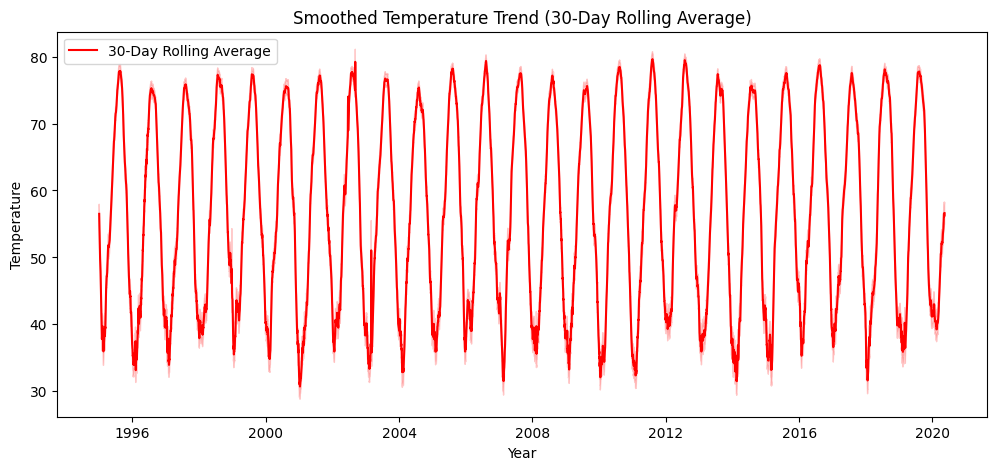

In [ ]:
# Rolling Average Plot (Trend Smoothing)
us["Rolling_Avg"] = us["AvgTemperature"].rolling(window=30, min_periods=1).mean()
plt.figure(figsize=(12, 5))
sns.lineplot(x=us["Date"], y=us["Rolling_Avg"], label="30-Day Rolling Average", color="red")
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Smoothed Temperature Trend (30-Day Rolling Average)")
plt.legend()
plt.show()

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


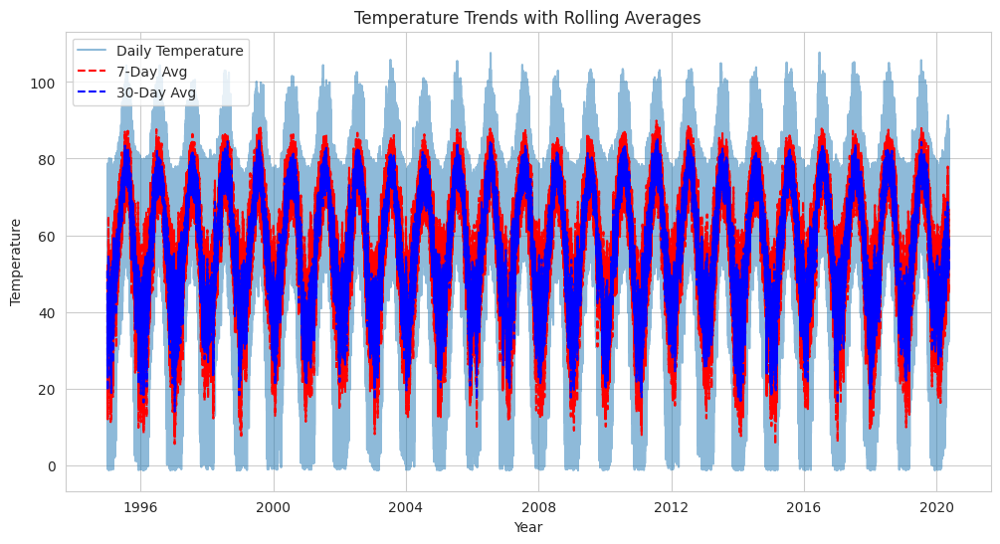

In [ ]:
sns.set_style("whitegrid")

# 1 **Time Series Plot with Rolling Averages**
plt.figure(figsize=(12, 6))
plt.plot(us["Date"], us["AvgTemperature"], label="Daily Temperature", alpha=0.5)
plt.plot(us["Date"], us["Rolling_7"], label="7-Day Avg", linestyle="--", color="red")
plt.plot(us["Date"], us["Rolling_30"], label="30-Day Avg", linestyle="--", color="blue")
plt.xlabel("Year")
plt.ylabel("Temperature")
plt.title("Temperature Trends with Rolling Averages")
plt.legend()
plt.show()

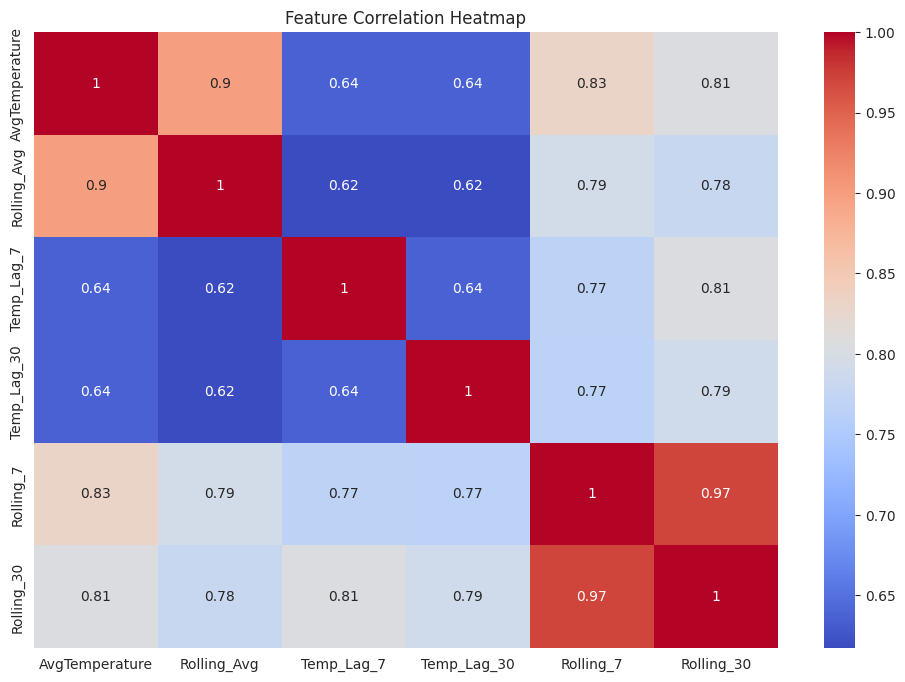

In [ ]:
# Scatter plot

plt.figure(figsize=(12,8))
sns.heatmap(us[['AvgTemperature', 'Rolling_Avg', 'Temp_Lag_7', 'Temp_Lag_30', 'Rolling_7', 'Rolling_30']].corr(), annot=True, cmap="coolwarm")
plt.title("Feature Correlation Heatmap")
plt.show()

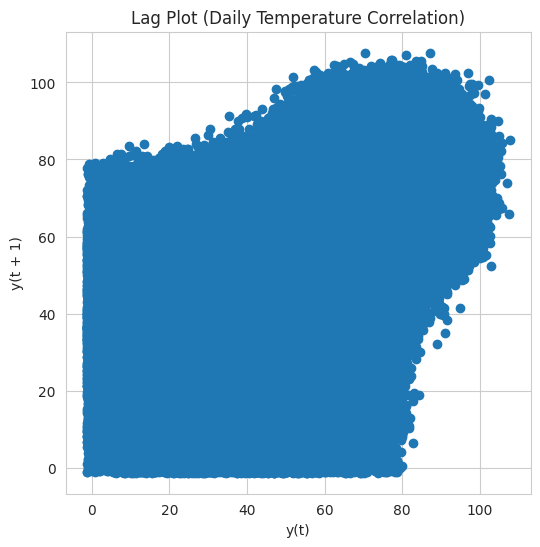

In [ ]:
# Lag Plot
from pandas.plotting import lag_plot
plt.figure(figsize=(6, 6))
lag_plot(us["AvgTemperature"])
plt.title("Lag Plot (Daily Temperature Correlation)")
plt.show()

In [ ]:
us.fillna(method="bfill", inplace=True)
us

<ipython-input-30-a896632ad752>:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  us.fillna(method="bfill", inplace=True)


,Region,Country,State,City,Month,Day,Year,AvgTemperature,Date,Rolling_Avg,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30
1450990,North America,US,Alabama,Birmingham,1,1,1995,50.7,1995-01-01,50.700000,50.7,50.7,50.7,50.700000,50.700000
2310093,North America,US,New York,Syracuse,1,1,1995,35.2,1995-01-01,42.116667,50.7,50.7,50.7,42.950000,42.950000
2603059,North America,US,Tennessee,Knoxville,1,1,1995,47.6,1995-01-01,59.250000,35.2,50.7,50.7,44.500000,44.500000
2319358,North America,US,North Carolina,Asheville,1,1,1995,47.4,1995-01-01,43.963333,47.6,50.7,50.7,45.225000,45.225000
2328623,North America,US,North Carolina,Charlotte,1,1,1995,41.9,1995-01-01,54.193333,47.4,50.7,50.7,44.560000,44.560000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547468,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,2020-05-13,47.183333,42.3,52.2,51.6,47.528571,54.493333
2797624,North America,US,Virginia,Richmond,5,13,2020,50.1,2020-05-13,56.510000,40.6,57.5,42.4,46.471429,54.750000
2843949,North America,US,West Virginia,Charleston,5,13,2020,45.9,2020-05-13,51.196667,50.1,46.7,69.1,46.357143,53.976667
1478784,North America,US,Alabama,Mobile,5,13,2020,64.2,2020-05-13,66.986667,45.9,53.3,70.5,47.914286,53.766667


In [ ]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

us['Season'] = us['Month'].apply(get_season)
print(us[['Month', 'Season']].head())

         Month  Season
1450990      1  Winter
2310093      1  Winter
2603059      1  Winter
2319358      1  Winter
2328623      1  Winter


In [ ]:
us.shape

(1445875, 16)

In [ ]:
us.dropna(inplace=True)
print("Missing values after adding lag features:\n", us.isnull().sum())

Missing values after adding lag features:
 Region            0
Country           0
State             0
City              0
Month             0
Day               0
Year              0
AvgTemperature    0
Date              0
Rolling_Avg       0
Temp_Lag_1        0
Temp_Lag_7        0
Temp_Lag_30       0
Rolling_7         0
Rolling_30        0
Season            0
dtype: int64


In [ ]:
us.shape

(1445875, 16)

##### 4.4.2 Encoding Categorical Features

##### (a) Encode the Season Column: Since Season has only 4 categories (Winter, Spring, Summer, Fall), we use One-Hot Encoding.




In [ ]:
us = pd.get_dummies(us, columns=['Season'])
print(us[['Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter']].head())

         Season_Fall  Season_Spring  Season_Summer  Season_Winter
1450990        False          False          False           True
2310093        False          False          False           True
2603059        False          False          False           True
2319358        False          False          False           True
2328623        False          False          False           True


####  (b) Label Encoding State and City

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder_state = LabelEncoder()
label_encoder_city = LabelEncoder()

us['State'] = label_encoder_state.fit_transform(us['State'])
us['City'] = label_encoder_city.fit_transform(us['City'])

print(us[['State', 'City']].head())

         State  City
1450990      1    14
2310093     33   135
2603059     43    72
2319358     34     7
2328623     34    25


In [ ]:
print(us.info())


<class 'pandas.core.frame.DataFrame'>
Index: 1445875 entries, 1450990 to 2402742
Data columns (total 19 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   Region          1445875 non-null  object        
 1   Country         1445875 non-null  object        
 2   State           1445875 non-null  int64         
 3   City            1445875 non-null  int64         
 4   Month           1445875 non-null  int64         
 5   Day             1445875 non-null  int64         
 6   Year            1445875 non-null  int64         
 7   AvgTemperature  1445875 non-null  float64       
 8   Date            1445875 non-null  datetime64[ns]
 9   Rolling_Avg     1445875 non-null  float64       
 10  Temp_Lag_1      1445875 non-null  float64       
 11  Temp_Lag_7      1445875 non-null  float64       
 12  Temp_Lag_30     1445875 non-null  float64       
 13  Rolling_7       1445875 non-null  float64       
 14  Rolling_30      1

## Normalization

When to Normalize Time Series Data?

Neural Networks (LSTMs) → Yes, normalization is highly recommended for stability.

Gradient-based models (XGBoost, Random Forest, etc.) → Usually, but not always necessary.

 When NOT to Normalize Time Series Data?

 Statistical models like ARIMA, SARIMA → Usually, they work better with original scale data.

 If your time series has a strong seasonality or trend, you might want to detrend or difference the data instead.


### We will use both normalized & original data according to our model preferences.


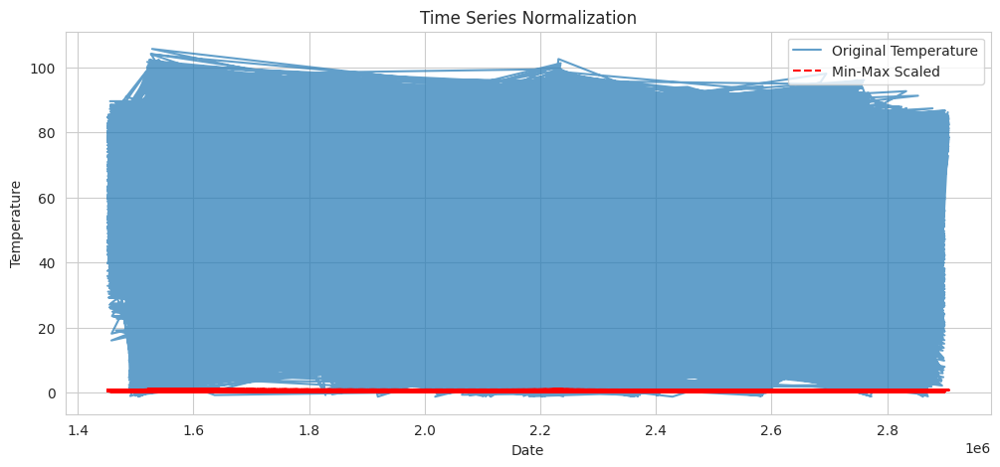

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Min-Max Scaling (0 to 1)
scaler_minmax = MinMaxScaler()
us["Temp_MinMax"] = scaler_minmax.fit_transform(us[["AvgTemperature"]])

# Standardization (Z-score)
scaler_std = StandardScaler()
us["Temp_Standardized"] = scaler_std.fit_transform(us[["AvgTemperature"]])

us_sampled = us.iloc[::10]
plt.figure(figsize=(12, 5))
plt.plot(us_sampled.index, us_sampled["AvgTemperature"], label="Original Temperature", alpha=0.7)
plt.plot(us_sampled.index, us_sampled["Temp_MinMax"], label="Min-Max Scaled", linestyle="--", color="red")
plt.xlabel("Date")
plt.ylabel("Temperature")
plt.title("Time Series Normalization")
plt.legend()
plt.show()


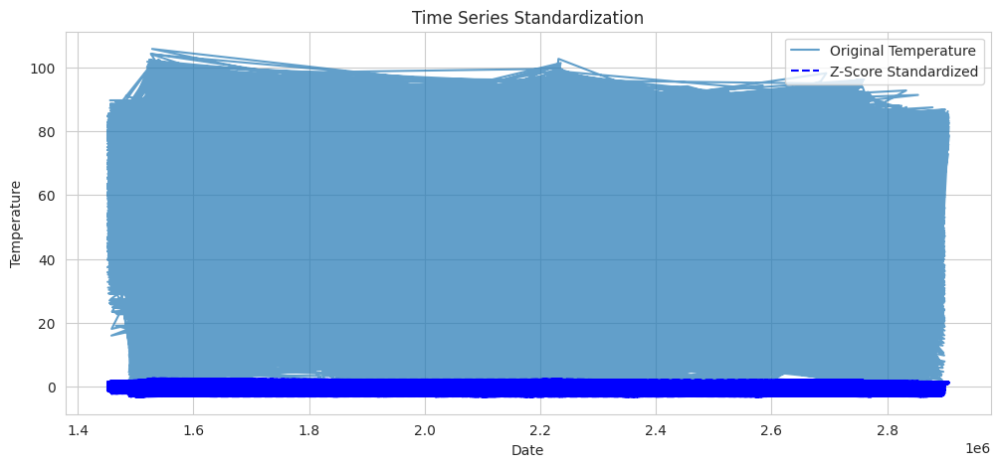

In [ ]:
plt.figure(figsize=(12, 5))
plt.plot(us_sampled.index, us_sampled["AvgTemperature"], label="Original Temperature", alpha=0.7)
plt.plot(us_sampled.index, us_sampled["Temp_Standardized"], label="Z-Score Standardized", linestyle="--", color="blue")
plt.xlabel("Date")
plt.ylabel("Temperature")
plt.title("Time Series Standardization")
plt.legend()
plt.show()


In [ ]:
us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Date,Rolling_Avg,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized
1450990,North America,US,1,14,1,1,1995,50.7,1995-01-01,50.700000,50.7,50.7,50.7,50.700000,50.700000,False,False,False,True,0.477064,-0.329234
2310093,North America,US,33,135,1,1,1995,35.2,1995-01-01,42.116667,50.7,50.7,50.7,42.950000,42.950000,False,False,False,True,0.334862,-1.159258
2603059,North America,US,43,72,1,1,1995,47.6,1995-01-01,59.250000,35.2,50.7,50.7,44.500000,44.500000,False,False,False,True,0.448624,-0.495239
2319358,North America,US,34,7,1,1,1995,47.4,1995-01-01,43.963333,47.6,50.7,50.7,45.225000,45.225000,False,False,False,True,0.446789,-0.505949
2328623,North America,US,34,25,1,1,1995,41.9,1995-01-01,54.193333,47.4,50.7,50.7,44.560000,44.560000,False,False,False,True,0.396330,-0.800473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547468,North America,US,39,149,5,13,2020,40.6,2020-05-13,47.183333,42.3,52.2,51.6,47.528571,54.493333,False,True,False,False,0.384404,-0.870088
2797624,North America,US,47,113,5,13,2020,50.1,2020-05-13,56.510000,40.6,57.5,42.4,46.471429,54.750000,False,True,False,False,0.471560,-0.361364
2843949,North America,US,49,24,5,13,2020,45.9,2020-05-13,51.196667,50.1,46.7,69.1,46.357143,53.976667,False,True,False,False,0.433028,-0.586274
1478784,North America,US,1,90,5,13,2020,64.2,2020-05-13,66.986667,45.9,53.3,70.5,47.914286,53.766667,False,True,False,False,0.600917,0.393689


Seasonal decomposition helps break down a time series into its fundamental components, making it easier to analyze and interpret trends, patterns, and anomalies.

Seasonal decomposition is crucial for filtering out noise, improving trend analysis, and making time series models more interpretable and accurate.

Advantages:

 Enhanced Trend Detection: The rolling average smooths out short-term fluctuations, making the long-term trend clearer.

 Seasonality Separation: The decomposition isolates seasonal effects, helping identify recurring patterns.

 Noise Reduction: By refining the trend and removing residuals, it helps in better forecasting and decision-making.

 Interpretability: The visualizations make it easier to analyze temperature trends over time.

In [ ]:
pip install statsmodels

Seasonal decomposition


<Figure size 1200x1200 with 0 Axes>

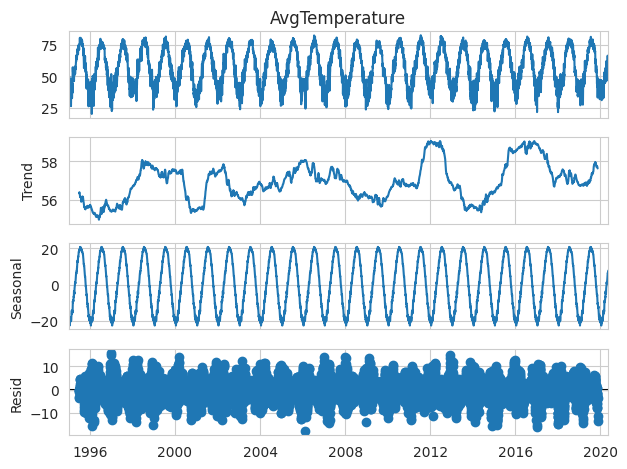

STL decomposition


<Figure size 1200x1200 with 0 Axes>

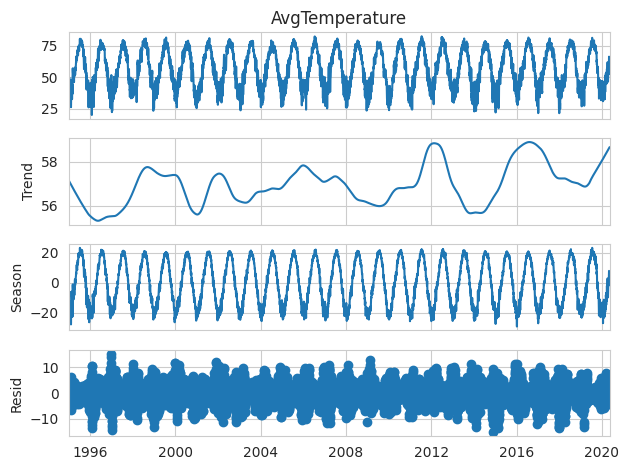

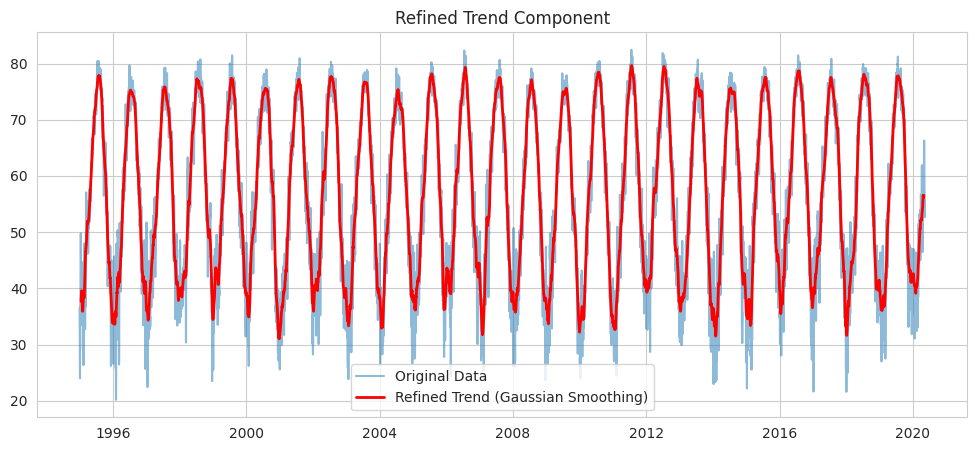

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose, STL

us['Date'] = pd.to_datetime(us[['Year', 'Month', 'Day']])
us.set_index('Date', inplace=True)
us_daily = us.groupby('Date')['AvgTemperature'].mean()
us_daily = us_daily.asfreq('D').interpolate()
result = seasonal_decompose(us_daily, model='additive', period=365)

print("Seasonal decomposition")
plt.figure(figsize=(12, 12))
result.plot()
plt.show()

stl = STL(us_daily, period=365)
result_stl = stl.fit()

print("STL decomposition")
plt.figure(figsize=(12, 12))
result_stl.plot()
plt.show()


window_size = 30
trend_refined = us_daily.rolling(window=window_size, center=True).mean()
# trend_refined = us_daily.rolling(window=window_size, win_type="gaussian", center=True).mean(std=5)

plt.figure(figsize=(12, 5))
plt.plot(us_daily, label='Original Data', alpha=0.5)
plt.plot(trend_refined, label='Refined Trend (Gaussian Smoothing)', color='red', linewidth=2)
plt.legend()
plt.title("Refined Trend Component")
plt.show()


In [ ]:
us.to_csv("/content/drive/MyDrive/Final_Group2/Preprocessed_Data.csv", index=False)


In [ ]:
unique_regions = us['State'].unique()
unique_countries = us['City'].unique()

print("Unique Regions:", unique_regions)
print("\nUnique Countries:", unique_countries)

Unique Regions: [ 1 33 43 34 50  6  5 35 42 49 44 30 31  9 32  7  8 36  2 51 40 38  0 39
 21 37  3  4 41 48 29 20 14 46 19 22 23 47 13 15 17 16 18 45 12 27 10 28
 24 11 26 25]

Unique Countries: [ 14 135  72   7  25  59  31  26  60 123 109  15 122  83 130  49  56  44
 108 115   0  34   9 144  95  92 117   3  24   2  62  20  18  85  94 150
   1  79  29  70  27 112  84  48 107   6  46 118 124 149   4  45  90  66
 105  91 145 141 104 110  30  54  88  33  78  37  50  52 138 153  23 152
 140  98  32 151  75  87  22 133 116  21  81 128  11  17  28  41  96  65
  51 106 102  57  47  93  55 143 147 129 121  76  40 119  80 131 101  67
 120  12  73  53 148  61  16  64  19  13 136  58  63 100 132 127  10  86
  97  69  99  38   5 111  77  74 137 146  43 125 113  42 126  89  82 134
  36 142 114   8  35  71  68 103 139  39]


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
us_revert = pd.read_csv("/content/drive/MyDrive/Final_Group2/Preprocessed_Data.csv")

label_encoder_state = LabelEncoder()
label_encoder_city = LabelEncoder()

original_states = ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
                   'Connecticut', 'Delaware', 'District of Columbia', 'Maryland', 'Florida',
                   'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas',
                   'Kentucky', 'Louisiana', 'Maine', 'Massachusetts', 'Michigan', 'Minnesota',
                   'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
                   'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota',
                   'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina',
                   'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia',
                   'Washington', 'West Virginia', 'Wisconsin', 'Wyoming', 'Additional Territories']

original_cities = ['Birmingham', 'Huntsville', 'Mobile', 'Montgomery', 'Anchorage', 'Fairbanks',
                   'Juneau', 'Flagstaff', 'Phoenix', 'Tucson', 'Yuma', 'Fort Smith', 'Little Rock',
                   'Fresno', 'Los Angeles', 'Sacramento', 'San Diego', 'San Francisco',
                   'Colorado Springs', 'Denver', 'Grand Junction', 'Pueblo', 'Bridgeport',
                   'Hartford Springfield', 'Wilmington', 'Washington', 'Washington DC',
                   'Daytona Beach', 'Jacksonville', 'Miami Beach', 'Orlando', 'Tallahassee',
                   'Tampa St. Petersburg', 'West Palm Beach', 'Atlanta', 'Columbus', 'Macon',
                   'Savannah', 'Honolulu', 'Boise', 'Pocatello', 'Chicago', 'Peoria', 'Rockford',
                   'Springfield', 'Evansville', 'Fort Wayne', 'Indianapolis', 'South Bend',
                   'Des Moines', 'Sioux City', 'Goodland', 'Topeka', 'Wichita', 'Lexington',
                   'Louisville', 'Paducah', 'Baton Rouge', 'Lake Charles', 'New Orleans',
                   'Shreveport', 'Caribou', 'Portland', 'Baltimore', 'Boston', 'Detroit', 'Flint',
                   'Grand Rapids', 'Lansing', 'Sault Ste Marie', 'Duluth',
                   'Minneapolis St. Paul', 'Jackson', 'Tupelo', 'Kansas City', 'St Louis',
                   'Billings', 'Great Falls', 'Helena', 'Lincoln', 'North Platte', 'Omaha', 'Reno',
                   'Las Vegas', 'Concord', 'Atlantic City', 'Newark', 'Albuquerque', 'Albany',
                   'Buffalo', 'New York City', 'Rochester', 'Syracuse', 'Asheville', 'Charlotte',
                   'Greensboro', 'Raleigh Durham', 'Bismarck', 'Fargo', 'Akron Canton',
                   'Cincinnati', 'Cleveland', 'Dayton', 'Toledo', 'Youngstown', 'Oklahoma City',
                   'Tulsa', 'Eugene', 'Medford', 'Salem', 'Allentown', 'Erie', 'Harrisburg',
                   'Philadelphia', 'Pittsburgh', 'Wilkes Barre', 'Rhode Island', 'Charleston',
                   'Columbia', 'Rapid City', 'Sioux Falls', 'Chattanooga', 'Knoxville', 'Memphis',
                   'Nashville', 'Abilene', 'Amarillo', 'Austin', 'Brownsville', 'Corpus Christi',
                   'Dallas Ft Worth', 'El Paso', 'Houston', 'Lubbock', 'Midland Odessa',
                   'San Angelo', 'San Antonio', 'Waco', 'Wichita Falls', 'Salt Lake City',
                   'Burlington', 'Norfolk', 'Richmond', 'Roanoke', 'Seattle', 'Spokane', 'Yakima',
                   'Elkins', 'Green Bay', 'Madison', 'Milwaukee', 'Casper', 'Cheyenne',
                   'San Juan Puerto Rico']

label_encoder_state.fit(original_states)
label_encoder_city.fit(original_cities)

us_revert['State'] = label_encoder_state.inverse_transform(us_revert['State'])
us_revert['City'] = label_encoder_city.inverse_transform(us_revert['City'])

us_revert.to_csv("/content/drive/MyDrive/Final_Group2/decoded_output.csv", index=False)

In [ ]:
csv_file = "/content/drive/MyDrive/Group2_temperature forecasting/decoded_output.csv"
us= pd.read_csv(csv_file, encoding="utf-8", low_memory=False)
us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,50.7,50.7,50.7,50.700000,50.700000,False,False,False,True,0.477064,-0.329234
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,50.7,50.7,50.7,42.950000,42.950000,False,False,False,True,0.334862,-1.159258
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,35.2,50.7,50.7,44.500000,44.500000,False,False,False,True,0.448624,-0.495239
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,47.6,50.7,50.7,45.225000,45.225000,False,False,False,True,0.446789,-0.505949
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,47.4,50.7,50.7,44.560000,44.560000,False,False,False,True,0.396330,-0.800473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445870,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,42.3,52.2,51.6,47.528571,54.493333,False,True,False,False,0.384404,-0.870088
1445871,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,40.6,57.5,42.4,46.471429,54.750000,False,True,False,False,0.471560,-0.361364
1445872,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,50.1,46.7,69.1,46.357143,53.976667,False,True,False,False,0.433028,-0.586274
1445873,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,45.9,53.3,70.5,47.914286,53.766667,False,True,False,False,0.600917,0.393689


In [ ]:
us['Date'] = pd.to_datetime(us[['Year', 'Month', 'Day']])

us_cleaned = us.drop_duplicates(subset=['Date', 'State', 'City'], keep='first')
us_cleaned

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,Date
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,50.7,50.7,50.7,50.700000,50.700000,False,False,False,True,0.477064,-0.329234,1995-01-01
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,50.7,50.7,50.7,42.950000,42.950000,False,False,False,True,0.334862,-1.159258,1995-01-01
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,35.2,50.7,50.7,44.500000,44.500000,False,False,False,True,0.448624,-0.495239,1995-01-01
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,47.6,50.7,50.7,45.225000,45.225000,False,False,False,True,0.446789,-0.505949,1995-01-01
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,47.4,50.7,50.7,44.560000,44.560000,False,False,False,True,0.396330,-0.800473,1995-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445870,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,42.3,52.2,51.6,47.528571,54.493333,False,True,False,False,0.384404,-0.870088,2020-05-13
1445871,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,40.6,57.5,42.4,46.471429,54.750000,False,True,False,False,0.471560,-0.361364,2020-05-13
1445872,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,50.1,46.7,69.1,46.357143,53.976667,False,True,False,False,0.433028,-0.586274,2020-05-13
1445873,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,45.9,53.3,70.5,47.914286,53.766667,False,True,False,False,0.600917,0.393689,2020-05-13


In [ ]:
us_cleaned['Date'] = pd.to_datetime(us_cleaned[['Year', 'Month', 'Day']])

filtered_data = us_cleaned[(us_cleaned['Date'] == "1995-04-03") &
                   (us_cleaned['City'] == "Washington DC") &
                   (us_cleaned['State'] == "Maryland")]

filtered_data

<ipython-input-47-c85a03961ffb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  us_cleaned['Date'] = pd.to_datetime(us_cleaned[['Year', 'Month', 'Day']])


,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,Date
14661,North America,US,Maryland,Washington DC,4,3,1995,48.6,50.31,54.5,59.1,55.5,55.414286,52.696667,False,True,False,False,0.457798,-0.441689,1995-04-03


In [ ]:
columns_to_drop = ['Temp_Lag_1', 'Temp_Lag_7', 'Temp_Lag_30', 'Rolling_7', 'Rolling_30','smoothed_temp']
us_cleaned = us_cleaned.drop(columns=columns_to_drop, errors='ignore')

In [ ]:
us_cleaned["smoothed_temp"] = us_cleaned["AvgTemperature"].rolling(window=3, min_periods=1).mean()

lags = [1, 7, 30]
for lag in lags:
    us_cleaned[f"Temp_Lag_{lag}"] = us_cleaned["smoothed_temp"].shift(lag)

us_cleaned["Rolling_7"] = us_cleaned["smoothed_temp"].rolling(window=7, min_periods=1).mean()
us_cleaned["Rolling_30"] = us_cleaned["smoothed_temp"].rolling(window=30, min_periods=1).mean()


In [ ]:
missing_values = us_cleaned.isnull().sum()

missing_values = missing_values[missing_values > 0]

if missing_values.empty:
    print("No missing values found in the dataset!")
else:
    print("Missing values detected:")
    print(missing_values)


Missing values detected:
Temp_Lag_1      1
Temp_Lag_7      7
Temp_Lag_30    30
dtype: int64


In [ ]:
us_cleaned = us_cleaned.fillna(method='bfill')
print("\nMissing values after filling:\n", us_cleaned.isnull().sum())

us_cleaned = us_cleaned
print("\nMissing values handled successfully!")

<ipython-input-51-a488665f61c2>:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  us_cleaned = us_cleaned.fillna(method='bfill')



Missing values after filling:
 Region               0
Country              0
State                0
City                 0
Month                0
Day                  0
Year                 0
AvgTemperature       0
Rolling_Avg          0
Season_Fall          0
Season_Spring        0
Season_Summer        0
Season_Winter        0
Temp_MinMax          0
Temp_Standardized    0
Date                 0
smoothed_temp        0
Temp_Lag_1           0
Temp_Lag_7           0
Temp_Lag_30          0
Rolling_7            0
Rolling_30           0
dtype: int64

Missing values handled successfully!


In [ ]:
us_cleaned.to_csv('/content/drive/MyDrive/Final_Group2/final_us.csv')
us_cleaned

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,Date,smoothed_temp,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,1995-01-01,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,1995-01-01,42.950000,50.700000,50.700000,50.700000,46.825000,46.825000
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,1995-01-01,44.500000,42.950000,50.700000,50.700000,46.050000,46.050000
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,1995-01-01,43.400000,44.500000,50.700000,50.700000,45.387500,45.387500
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,1995-01-01,45.633333,43.400000,50.700000,50.700000,45.436667,45.436667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1445870,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,2020-05-13,41.933333,44.866667,45.766667,53.400000,48.838095,54.706667
1445871,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,2020-05-13,44.333333,41.933333,52.100000,44.500000,47.728571,54.701111
1445872,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,2020-05-13,45.533333,44.333333,52.133333,54.366667,46.785714,54.406667
1445873,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,False,True,False,False,0.600917,0.393689,2020-05-13,53.400000,45.533333,52.500000,60.666667,46.914286,54.164444


# MODELLING

## Random Forest

In [ ]:
import pandas as pd
import numpy as np

file_path = "/content/drive/MyDrive/Group2_temperature forecasting/final_us.csv"
final_us = pd.read_csv(file_path)

print("Dataset Info:")
print(final_us.info())

display(final_us.head())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1427377 entries, 0 to 1427376
Data columns (total 23 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Unnamed: 0         1427377 non-null  int64  
 1   Region             1427377 non-null  object 
 2   Country            1427377 non-null  object 
 3   State              1427377 non-null  object 
 4   City               1427377 non-null  object 
 5   Month              1427377 non-null  int64  
 6   Day                1427377 non-null  int64  
 7   Year               1427377 non-null  int64  
 8   AvgTemperature     1427377 non-null  float64
 9   Rolling_Avg        1427377 non-null  float64
 10  Season_Fall        1427377 non-null  bool   
 11  Season_Spring      1427377 non-null  bool   
 12  Season_Summer      1427377 non-null  bool   
 13  Season_Winter      1427377 non-null  bool   
 14  Temp_MinMax        1427377 non-null  float64
 15  Temp_Standardized 

,Unnamed: 0,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,Date,smoothed_temp,Temp_Lag_1,Temp_Lag_7,Temp_Lag_30,Rolling_7,Rolling_30
0,0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,1995-01-01,50.700000,50.70,50.7,50.7,50.700000,50.700000
1,1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,1995-01-01,42.950000,50.70,50.7,50.7,46.825000,46.825000
2,2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,1995-01-01,44.500000,42.95,50.7,50.7,46.050000,46.050000
3,3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,1995-01-01,43.400000,44.50,50.7,50.7,45.387500,45.387500
4,4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,1995-01-01,45.633333,43.40,50.7,50.7,45.436667,45.436667


In [ ]:
from sklearn.preprocessing import LabelEncoder

final_us['Date'] = pd.to_datetime(final_us[['Year', 'Month', 'Day']])
final_us.set_index('Date', inplace=True)

columns_to_drop = ['Temp_Lag_1', 'Temp_Lag_7', 'Temp_Lag_30']
final_us.drop(columns=[col for col in columns_to_drop if col in final_us.columns], inplace=True, errors='ignore')

final_us['smoothed_temp'] = final_us['AvgTemperature'].rolling(window=3, min_periods=1).mean()
final_us['lag_1'] = final_us['smoothed_temp'].shift(1)
final_us['lag_7'] = final_us['smoothed_temp'].shift(7)
final_us['lag_30'] = final_us['smoothed_temp'].shift(30)
final_us['rolling_7'] = final_us['smoothed_temp'].rolling(window=7).mean()
final_us['rolling_30'] = final_us['smoothed_temp'].rolling(window=30).mean()

final_us['day_of_week'] = final_us.index.dayofweek
final_us['day_of_year'] = final_us.index.dayofyear
final_us['week_of_year'] = final_us.index.isocalendar().week

le_state = LabelEncoder()
le_city = LabelEncoder()

final_us['State_Encoded'] = le_state.fit_transform(final_us['State'])
final_us['City_Encoded'] = le_city.fit_transform(final_us['City'])


final_us.fillna(method="bfill", inplace=True)

<ipython-input-4-3268ed577de7>:27: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  final_us.fillna(method="bfill", inplace=True)


In [ ]:
final_us

,Unnamed: 0,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14
1995-01-01,1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135
1995-01-01,2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72
1995-01-01,3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7
1995-01-01,4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,1445870,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149
2020-05-13,1445871,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113
2020-05-13,1445872,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24


In [ ]:
final_us.drop('Unnamed: 0', axis=1, inplace=True)
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import joblib

features = ['State_Encoded', 'City_Encoded', 'Month', 'Day', 'Year', 'lag_1', 'lag_7', 'lag_30',
            'rolling_7', 'rolling_30', 'day_of_week', 'day_of_year', 'week_of_year']
target = 'smoothed_temp'

X_train, X_test, y_train, y_test = train_test_split(final_us[features], final_us[target],
                                                    test_size=0.2, random_state=42, shuffle=False)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)
joblib.dump(rf_model, '/content/drive/MyDrive/Group2_final/random_forest_model.pkl')
print("Random Forest model trained and saved.")

Random Forest model trained and saved.


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

y_pred = rf_model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Random Forest RMSE: {rmse:.4f}")
print(f"Random Forest MAE : {mae:.4f}")
print(f"Random Forest R²  : {r2:.4f}")



Random Forest RMSE: 3.9175
Random Forest MAE : 2.9997
Random Forest R²  : 0.9394


In [ ]:
final_us['RF_Predicted'] = rf_model.predict(final_us[features])
print("Predictions added to final_us dataset.")
final_us

Predictions added to final_us dataset.


,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000


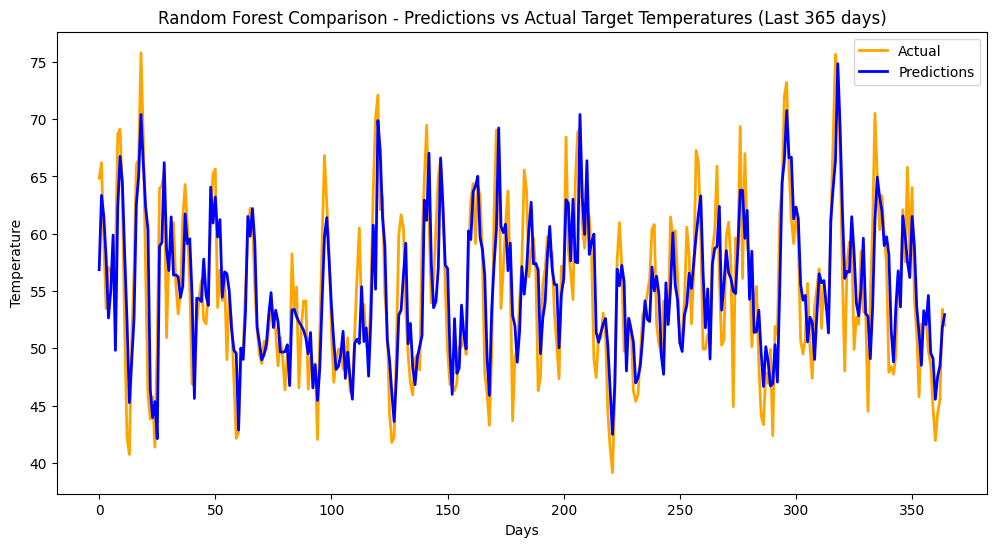

In [ ]:
import matplotlib.pyplot as plt

actual_vals = final_us['smoothed_temp'][-365:].values
predicted_vals = final_us['RF_Predicted'][-365:].values

plt.figure(figsize=(12, 6))
plt.plot(actual_vals, label='Actual', color='orange', linewidth=2)
plt.plot(predicted_vals, label='Predictions', color='blue', linewidth=2)
plt.title('Random Forest Comparison - Predictions vs Actual Target Temperatures (Last 365 days)')
plt.xlabel('Days')
plt.ylabel('Temperature')
plt.legend()
plt.show()


In [ ]:
from datetime import timedelta

city_forecasts = {}
unique_cities = final_us['City_Encoded'].unique()

city_code_to_name = final_us[['City_Encoded', 'City']].drop_duplicates().set_index('City_Encoded').to_dict()['City']

for city_code in unique_cities:
    city_data = final_us[final_us['City_Encoded'] == city_code].copy()
    city_data = city_data.sort_index()
    last_date = city_data.index[-1]
    future_dates = [last_date + timedelta(days=i) for i in range(1, 11)]

    forecast_values = []
    state_code = city_data['State_Encoded'].iloc[-1]
    for future_date in future_dates:
        row = {
            'State_Encoded': state_code,
            'City_Encoded': city_code,
            'Month': future_date.month,
            'Day': future_date.day,
            'Year': future_date.year,
            'lag_1': city_data['smoothed_temp'].iloc[-1],
            'lag_7': city_data['smoothed_temp'].iloc[-7] if len(city_data) >= 7 else city_data['smoothed_temp'].iloc[-1],
            'lag_30': city_data['smoothed_temp'].iloc[-30] if len(city_data) >= 30 else city_data['smoothed_temp'].iloc[-1],
            'rolling_7': city_data['smoothed_temp'].rolling(window=7).mean().iloc[-1],
            'rolling_30': city_data['smoothed_temp'].rolling(window=30).mean().iloc[-1],
            'day_of_week': future_date.weekday(),
            'day_of_year': future_date.timetuple().tm_yday,
            'week_of_year': future_date.isocalendar().week
        }
        input_df = pd.DataFrame([row])
        prediction = rf_model.predict(input_df[features])[0]
        forecast_values.append(prediction)
        city_data.loc[future_date] = prediction

    forecast_df = pd.DataFrame({'Date': future_dates, 'ForecastedTemp': forecast_values}).set_index('Date')
    city_forecasts[city_code] = forecast_df

print("10-day forecasts generated for each city with city names.")


10-day forecasts generated for each city with city names.


In [ ]:
import plotly.graph_objects as go

buttons = []
traces = []

for city_code in unique_cities:
    city_name = city_code_to_name[city_code]
    city_data = final_us[final_us['City_Encoded'] == city_code].copy()
    actual_last_90 = city_data['smoothed_temp'].iloc[-90:]
    forecast = city_forecasts[city_code]

    last_actual_date = actual_last_90.index[-1]
    last_actual_value = actual_last_90.iloc[-1]

    forecast_continuous = pd.concat([
        pd.DataFrame({'ForecastedTemp': [last_actual_value]}, index=[last_actual_date]),
        forecast
    ])

    traces.append(go.Scatter(x=actual_last_90.index, y=actual_last_90.values, mode='lines',
                             name=f'Actual - {city_name}', visible=False))

    traces.append(go.Scatter(x=forecast_continuous.index, y=forecast_continuous['ForecastedTemp'], mode='lines+markers',
                             name=f'Forecast - {city_name}', line=dict(dash='dot'), visible=False))

for i, city_code in enumerate(unique_cities):
    city_name = city_code_to_name[city_code]
    vis = [False] * (len(unique_cities) * 2)
    vis[2 * i] = True
    vis[2 * i + 1] = True
    buttons.append(dict(method='update', label=f'{city_name}', args=[{'visible': vis}]))

fig = go.Figure(traces)
fig.update_layout(
    updatemenus=[dict(type='dropdown', direction='down', buttons=buttons)],
    title='City-Wise Random Forest Forecast',
    width=1400,
    height=600
)
fig.show()


In [ ]:
final_us_RF=final_us.copy()
final_us_RF

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000


In [ ]:
final_us_RF.to_csv('/content/drive/MyDrive/Final_Group2/final_us_RF.csv')

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

rf_city_errors = []

for city in final_us['City'].unique():
    city_df = final_us[final_us['City'] == city]
    actual = city_df['smoothed_temp']
    predicted = city_df['RF_Predicted']

    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)

    rf_city_errors.append({'City': city, 'RF_RMSE': rmse, 'RF_MAE': mae, 'RF_R2': r2})

rf_errors_df = pd.DataFrame(rf_city_errors)
rf_errors_df.sort_values('RF_RMSE', ascending=False, inplace=True)
rf_errors_df.to_csv("/content/drive/MyDrive/Final_Group2/random_forest_city_errors.csv", index=False)
rf_errors_df.head()

,City,RF_RMSE,RF_MAE,RF_R2
119,Great Falls,2.613973,1.784451,0.973037
120,Helena,2.593784,1.744382,0.975120
59,Rapid City,2.569448,1.740810,0.976427
117,Billings,2.559343,1.754592,0.975971
11,Bismarck,2.496023,1.715541,0.979250


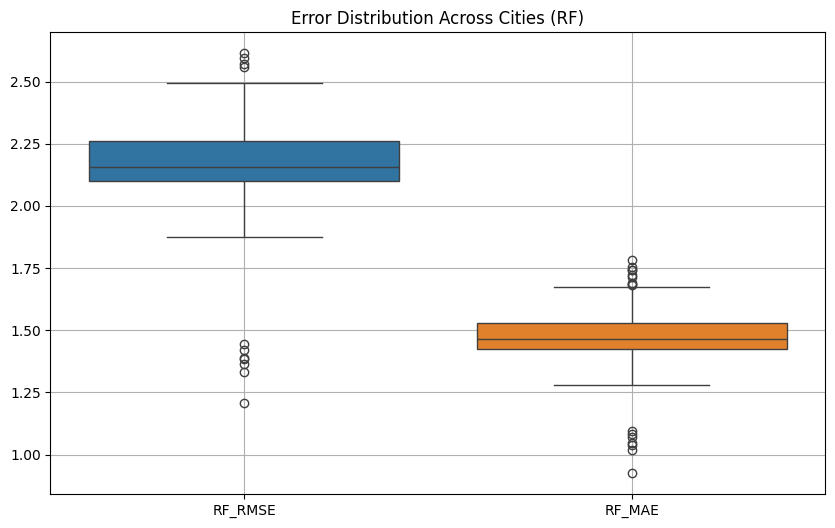

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.boxplot(data=rf_errors_df[['RF_RMSE', 'RF_MAE']])
plt.title("Error Distribution Across Cities (RF)")
plt.grid(True)
plt.show()

In [ ]:
pip install geopy pandas plotly


In [ ]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import pandas as pd

# rf_errors_df = pd.read_csv("/content/drive/MyDrive/Final_Group2/random_forest_city_errors.csv")

geolocator = Nominatim(user_agent="city_geocoder")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

rf_errors_df['location'] = rf_errors_df['City'] + ', USA'
rf_errors_df['coordinates'] = rf_errors_df['location'].apply(geocode)

rf_errors_df['latitude'] = rf_errors_df['coordinates'].apply(lambda loc: loc.latitude if loc else None)
rf_errors_df['longitude'] = rf_errors_df['coordinates'].apply(lambda loc: loc.longitude if loc else None)


In [ ]:
rf_errors_df.to_csv("/content/drive/MyDrive/Final_Group2/rf_errors_with_coords.csv", index=False)


In [ ]:
rf_errors_df

,City,RF_RMSE,RF_MAE,RF_R2,location,coordinates,latitude,longitude
119,Great Falls,2.613973,1.784451,0.973037,"Great Falls, USA","(Great Falls, Cascade County, Montana, United ...",47.504885,-111.291890
120,Helena,2.593784,1.744382,0.975120,"Helena, USA","(Helena, Lewis and Clark County, Montana, Unit...",46.592742,-112.036277
59,Rapid City,2.569448,1.740810,0.976427,"Rapid City, USA","(Rapid City, Pennington County, South Dakota, ...",44.080604,-103.228023
117,Billings,2.559343,1.754592,0.975971,"Billings, USA","(Billings, Yellowstone County, Montana, United...",45.787496,-108.496070
11,Bismarck,2.496023,1.715541,0.979250,"Bismarck, USA","(Bismarck, Burleigh County, North Dakota, Unit...",46.808327,-100.783739
...,...,...,...,...,...,...,...,...
69,Yuma,1.386741,1.071899,0.991528,"Yuma, USA","(Yuma, Yuma County, Arizona, United States, (3...",32.723268,-114.617995
35,Wilmington,1.383324,1.045512,0.992769,"Wilmington, USA","(Wilmington, New Castle County, Delaware, Unit...",39.745947,-75.546589
113,Harrisburg,1.365776,1.037733,0.993242,"Harrisburg, USA","(Harrisburg, Dauphin County, Pennsylvania, Uni...",40.266311,-76.886112
129,Daytona Beach,1.333458,1.016599,0.990808,"Daytona Beach, USA","(Daytona Beach, Volusia County, Florida, Unite...",29.210815,-81.022833


## XGBoost

In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000


In [ ]:
!pip install xgboost --quiet

import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

In [ ]:
features = ['State_Encoded','City_Encoded','Month', 'Day', 'Year',
            'lag_1', 'lag_7', 'lag_30', 'rolling_7', 'rolling_30',
            'day_of_week', 'day_of_year', 'week_of_year']
target = 'smoothed_temp'

X = final_us[features]
y = final_us[target]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [ ]:
xgb_model = xgb.XGBRegressor(
    objective="reg:squarederror",
    n_estimators=500,
    learning_rate=0.05,
    tree_method='hist'
)

print("Training XGBoost Model")
xgb_model.fit(X_train, y_train)

xgb_model.save_model("/content/drive/MyDrive/Final_Group2/xgboost_model.json")
print("\n XGBoost Model Training Completed & Saved!")


Training XGBoost Model

 XGBoost Model Training Completed & Saved!


In [ ]:
final_us["XGBoost_Prediction"] = xgb_model.predict(X)

In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667,48.912312
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500,42.398167
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000,41.088913
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333,41.219246
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333,42.068871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000,45.311489
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667,46.162239
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000,47.343838


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

y_true = y
y_pred = final_us["XGBoost_Prediction"]

mae_full = mean_absolute_error(y_true, y_pred)
rmse_full = np.sqrt(mean_squared_error(y_true, y_pred))
r2_full = r2_score(y_true, y_pred)

print(f"XGBoost Model RMSE: {rmse_full:.4f}")
print(f"XGBoost Model MAE: {mae_full:.4f}")
print(f"XGBoost Model R²: {r2_full:.4f}")


XGBoost Model RMSE: 3.7438
XGBoost Model MAE: 2.8738
XGBoost Model R²: 0.9470


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



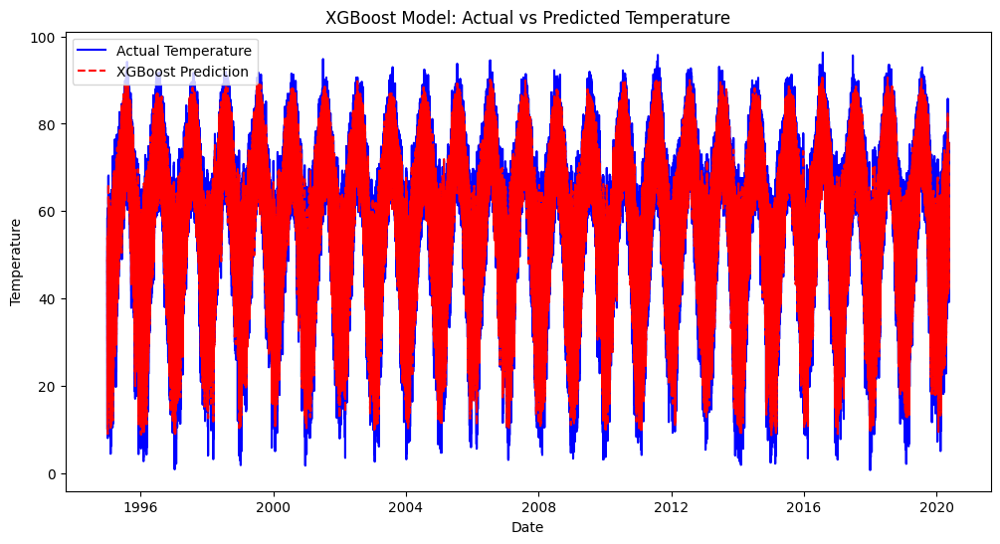

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(final_us.index, final_us["smoothed_temp"], label="Actual Temperature", color='blue')
plt.plot(final_us.index, final_us["XGBoost_Prediction"], label="XGBoost Prediction", color='red', linestyle='dashed')

plt.xlabel("Date")
plt.ylabel("Temperature")
plt.title("XGBoost Model: Actual vs Predicted Temperature")
plt.legend()
plt.show()


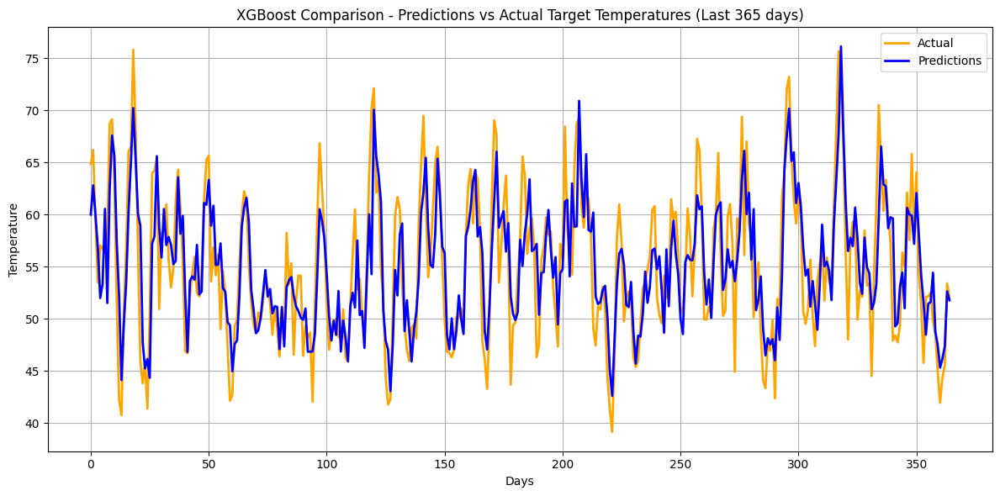

In [ ]:
import matplotlib.pyplot as plt

subset_size = 365
subset_actual = y_test[-subset_size:]
subset_predicted = pd.Series(y_pred[-subset_size:], index=subset_actual.index)

plt.figure(figsize=(12, 6))
plt.plot(subset_actual.values, label="Actual", color='orange', linewidth=2)
plt.plot(subset_predicted.values, label="Predictions", color='blue', linewidth=2)

plt.xlabel("Days")
plt.ylabel("Temperature")
plt.title("XGBoost Comparison - Predictions vs Actual Target Temperatures (Last 365 days)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# columns_to_drop = [
#   'Unnamed: 0',	'Country'
# ]
# final_us.drop(columns=columns_to_drop, inplace=True)
final_us

In [ ]:
from datetime import timedelta

xgb_city_forecasts = {}
unique_cities = final_us['City_Encoded'].unique()
city_code_to_name = final_us[['City_Encoded', 'City']].drop_duplicates().set_index('City_Encoded').to_dict()['City']

for city_code in unique_cities:
    city_data = final_us[final_us['City_Encoded'] == city_code].copy()
    city_data = city_data.sort_index()
    last_date = city_data.index[-1]
    future_dates = [last_date + timedelta(days=i) for i in range(1, 11)]

    forecast_values = []
    state_code = city_data['State_Encoded'].iloc[-1]
    for future_date in future_dates:
        row = {
            'State_Encoded': state_code,
            'City_Encoded': city_code,
            'Month': future_date.month,
            'Day': future_date.day,
            'Year': future_date.year,
            'lag_1': city_data['smoothed_temp'].iloc[-1],
            'lag_7': city_data['smoothed_temp'].iloc[-7] if len(city_data) >= 7 else city_data['smoothed_temp'].iloc[-1],
            'lag_30': city_data['smoothed_temp'].iloc[-30] if len(city_data) >= 30 else city_data['smoothed_temp'].iloc[-1],
            'rolling_7': city_data['smoothed_temp'].rolling(window=7).mean().iloc[-1],
            'rolling_30': city_data['smoothed_temp'].rolling(window=30).mean().iloc[-1],
            'day_of_week': future_date.weekday(),
            'day_of_year': future_date.timetuple().tm_yday,
            'week_of_year': future_date.isocalendar().week
        }
        input_df = pd.DataFrame([row])
        prediction = xgb_model.predict(input_df[features])[0]
        forecast_values.append(prediction)
        city_data.loc[future_date] = prediction

    forecast_df = pd.DataFrame({'Date': future_dates, 'XGB_ForecastedTemp': forecast_values}).set_index('Date')
    xgb_city_forecasts[city_code] = forecast_df

print("10-day XGBoost forecasts generated for each city.")


10-day XGBoost forecasts generated for each city.


In [ ]:
import plotly.graph_objects as go

xgb_buttons = []
xgb_traces = []

for city_code in unique_cities:
    city_name = city_code_to_name[city_code]
    city_data = final_us[final_us['City_Encoded'] == city_code].copy()
    actual_last_90 = city_data['smoothed_temp'].iloc[-90:]

    forecast = xgb_city_forecasts[city_code].copy()

    last_actual_date = actual_last_90.index[-1]
    last_actual_value = actual_last_90.values[-1]
    forecast_continuous = pd.concat([
        pd.DataFrame({'XGB_ForecastedTemp': [last_actual_value]}, index=[last_actual_date]),
        forecast
    ])

    xgb_traces.append(go.Scatter(
        x=actual_last_90.index,
        y=actual_last_90.values,
        mode='lines',
        name=f'Actual - {city_name}',
        visible=False
    ))

    xgb_traces.append(go.Scatter(
        x=forecast_continuous.index,
        y=forecast_continuous['XGB_ForecastedTemp'],
        mode='lines+markers',
        name=f'XGBoost Forecast - {city_name}',
        line=dict(dash='dot'),
        visible=False
    ))

for i, city_code in enumerate(unique_cities):
    city_name = city_code_to_name[city_code]
    vis = [False] * (len(unique_cities) * 2)
    vis[2 * i] = True
    vis[2 * i + 1] = True
    xgb_buttons.append(dict(method='update', label=f'{city_name}', args=[{'visible': vis}]))

fig = go.Figure(xgb_traces)
fig.update_layout(
    updatemenus=[dict(type='dropdown', direction='down', buttons=xgb_buttons)],
    title='Interactive City-Wise XGBoost Forecast',
    width=1400,
    height=600
)
fig.show()


In [ ]:
final_us_XGBoost=final_us.copy()
final_us_XGBoost

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667,48.912312
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500,42.398167
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000,41.088913
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333,41.219246
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333,42.068871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000,45.311489
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667,46.162239
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000,47.343838


In [ ]:
final_us_XGBoost.to_csv('/content/drive/MyDrive/Final_Group2/final_us__RF_XGBoost.csv', index=False)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

xgb_error_summary = []

for city in final_us['City'].unique():
    city_data = final_us[final_us['City'] == city]
    actual = city_data['smoothed_temp']
    predicted = city_data['XGBoost_Prediction']

    rmse = np.sqrt(mean_squared_error(actual, predicted))
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)

    xgb_error_summary.append({
        'City': city,
        'XGB_RMSE': rmse,
        'XGB_MAE': mae,
        'XGB_R2': r2
    })

xgb_errors_df = pd.DataFrame(xgb_error_summary)


In [ ]:
merged_df = rf_errors_df.merge(xgb_errors_df, on='City', how='left')


In [ ]:
merged_df.to_csv('/content/drive/MyDrive/Final_Group2/error_summary_RF_XGB.csv', index=False)


In [ ]:
merged_df

,City,RF_RMSE,RF_MAE,RF_R2,location,coordinates,latitude,longitude,XGB_RMSE,XGB_MAE,XGB_R2
0,Great Falls,2.613973,1.784451,0.973037,"Great Falls, USA","(Great Falls, Cascade County, Montana, United ...",47.504885,-111.291890,4.582049,3.573113,0.917151
1,Helena,2.593784,1.744382,0.975120,"Helena, USA","(Helena, Lewis and Clark County, Montana, Unit...",46.592742,-112.036277,4.402934,3.400936,0.928307
2,Rapid City,2.569448,1.740810,0.976427,"Rapid City, USA","(Rapid City, Pennington County, South Dakota, ...",44.080604,-103.228023,4.348592,3.339703,0.932481
3,Billings,2.559343,1.754592,0.975971,"Billings, USA","(Billings, Yellowstone County, Montana, United...",45.787496,-108.496070,4.425960,3.450064,0.928140
4,Bismarck,2.496023,1.715541,0.979250,"Bismarck, USA","(Bismarck, Burleigh County, North Dakota, Unit...",46.808327,-100.783739,4.105927,3.191845,0.943852
...,...,...,...,...,...,...,...,...,...,...,...
149,Yuma,1.386741,1.071899,0.991528,"Yuma, USA","(Yuma, Yuma County, Arizona, United States, (3...",32.723268,-114.617995,3.326617,2.609537,0.951245
150,Wilmington,1.383324,1.045512,0.992769,"Wilmington, USA","(Wilmington, New Castle County, Delaware, Unit...",39.745947,-75.546589,3.513161,2.674826,0.953360
151,Harrisburg,1.365776,1.037733,0.993242,"Harrisburg, USA","(Harrisburg, Dauphin County, Pennsylvania, Uni...",40.266311,-76.886112,3.561764,2.726591,0.954041
152,Daytona Beach,1.333458,1.016599,0.990808,"Daytona Beach, USA","(Daytona Beach, Volusia County, Florida, Unite...",29.210815,-81.022833,3.494106,2.683557,0.936885


## LSTM

In [ ]:
csv_file = "/content/drive/MyDrive/Final_Group2/final_us__RF_XGBoost.csv"
final_us = pd.read_csv(csv_file, encoding="utf-8", low_memory=False)
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,False,False,False,True,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,1,14,50.890667,48.912310
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,False,False,False,True,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6,1,52,33,135,44.133500,42.398167
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,False,False,False,True,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6,1,52,43,72,43.568000,41.088913
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,False,False,False,True,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,7,43.334333,41.219246
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,False,False,False,True,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6,1,52,34,25,43.642333,42.068870
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,False,True,False,False,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2,134,20,39,149,45.544000,45.311490
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,False,True,False,False,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2,134,20,47,113,47.539667,46.162240
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,False,True,False,False,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2,134,20,49,24,48.482000,47.343838
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,False,True,False,False,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2,134,20,1,90,51.790000,52.614250


In [ ]:
!pip install tensorflow

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import joblib
import os


In [ ]:
lstm_features = [
    'smoothed_temp', 'lag_1', 'lag_7', 'lag_30',
    'rolling_7', 'rolling_30',
    'Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter',
    'day_of_week', 'day_of_year', 'week_of_year',
    'Temp_MinMax', 'Temp_Standardized'
]

scaler = StandardScaler()
final_us[lstm_features] = scaler.fit_transform(final_us[lstm_features])
joblib.dump(scaler, "/content/drive/MyDrive/Final_Group2/lstm_scaler.pkl")
print("Scaling done & scaler saved.")

Scaling done & scaler saved.


In [ ]:
def create_sequences_vectorized(df, features, seq_length=30):
    data = df[features].astype(float).to_numpy()
    num_sequences = data.shape[0] - seq_length
    strides = data.strides[0]
    sequences = np.lib.stride_tricks.as_strided(
        data,
        shape=(num_sequences, seq_length, data.shape[1]),
        strides=(strides, strides, data.strides[1])
    )
    targets = data[seq_length:, 0]
    return sequences, targets

X, y = create_sequences_vectorized(final_us, lstm_features)
print(f"Created sequences: shape {X.shape}")


Created sequences: shape (1427347, 30, 15)


In [ ]:
split_idx = int(0.8 * len(X))
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]


In [ ]:
lstm_model_path = "/content/drive/MyDrive/Final_Group2/lstm_model.keras"

if os.path.exists(lstm_model_path):
    model = load_model(lstm_model_path)
    print("Loaded existing LSTM model.")
else:
    model = Sequential([
        LSTM(100, activation='tanh', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
        Dropout(0.2),
        LSTM(50, activation='tanh', return_sequences=False),
        Dropout(0.2),
        Dense(25, activation='relu'),
        Dense(1)
    ])

    model.compile(optimizer='adam', loss='mean_squared_error')
    early_stop = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-5)

    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=15, batch_size=256, callbacks=[early_stop, reduce_lr])
    model.save(lstm_model_path)
    print("LSTM model trained and saved.")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 40s 8ms/step - loss: 0.0862 - val_loss: 0.0597 - learning_rate: 0.0010
Epoch 2/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - loss: 0.0588 - val_loss: 0.0671 - learning_rate: 0.0010
Epoch 3/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 38s 8ms/step - loss: 0.0575 - val_loss: 0.0767 - learning_rate: 0.0010
Epoch 4/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - loss: 0.0570 - val_loss: 0.0760 - learning_rate: 0.0010
Epoch 5/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 35s 8ms/step - loss: 0.0563 - val_loss: 0.0784 - learning_rate: 5.0000e-04
Epoch 6/15
4461/4461 ━━━━━━━━━━━━━━━━━━━━ 36s 8ms/step - loss: 0.0562 - val_loss: 0.0795 - learning_rate: 5.0000e-04
LSTM model trained and saved.


In [ ]:
def fast_forecast_lstm(model, X_input, batch_size=2048):
    preds = []
    for i in range(0, len(X_input), batch_size):
        batch = X_input[i:i+batch_size]
        batch_preds = model.predict(batch, verbose=0).flatten()
        preds.extend(batch_preds)
    return np.array(preds)

predictions_full = fast_forecast_lstm(model, X, batch_size=2048)
final_us['LSTM_Predicted_Scaled'] = np.nan
final_us.iloc[30:, final_us.columns.get_loc('LSTM_Predicted_Scaled')] = predictions_full


In [ ]:
lstm_scaler = joblib.load("/content/drive/MyDrive/Final_Group2/lstm_scaler.pkl")
lstm_mean = lstm_scaler.mean_[0]
lstm_std = np.sqrt(lstm_scaler.var_[0])

final_us['LSTM_Predicted_Original'] = (final_us['LSTM_Predicted_Scaled'] * lstm_std) + lstm_mean

In [ ]:
import joblib

scaler_lstm = joblib.load('/content/drive/MyDrive/Final_Group2/lstm_scaler.pkl')

scaled_columns = ['smoothed_temp', 'lag_1', 'lag_7', 'lag_30',
                  'rolling_7', 'rolling_30', 'Season_Fall', 'Season_Spring',
                  'Season_Summer', 'Season_Winter', 'day_of_week', 'day_of_year',
                  'week_of_year', 'Temp_MinMax', 'Temp_Standardized']

scaled_values = final_us[scaled_columns].astype(float).values
original_values = scaler_lstm.inverse_transform(scaled_values)

final_us[scaled_columns] = original_values
print("All scaled features have been reverted to their original values.")

All scaled features have been reverted to their original values.


In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,2.775558e-17,0.0,-2.775558e-17,1.0,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,NaN,NaN
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,2.775558e-17,0.0,-2.775558e-17,1.0,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,NaN,NaN
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,2.775558e-17,0.0,-2.775558e-17,1.0,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,NaN,NaN
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,2.775558e-17,0.0,-2.775558e-17,1.0,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,NaN,NaN
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,2.775558e-17,0.0,-2.775558e-17,1.0,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,2.775558e-17,1.0,-2.775558e-17,0.0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,2.775558e-17,1.0,-2.775558e-17,0.0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,2.775558e-17,1.0,-2.775558e-17,0.0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,2.775558e-17,1.0,-2.775558e-17,0.0,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2.0,134.0,20.0,1,90,51.790000,52.614250,-0.358206,51.003379


In [ ]:
final_us['Date'] = pd.to_datetime(final_us[['Year', 'Month', 'Day']])
final_us.set_index('Date', inplace=True)

season_cols = ['Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter']
final_us[season_cols] = final_us[season_cols].round().astype(int)
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,NaN,NaN
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,NaN,NaN
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,NaN,NaN
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,NaN,NaN
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383


In [ ]:
final_us.fillna(method='bfill', inplace=True)

final_us.fillna(method='ffill', inplace=True)

print("Missing values filled using backward fill and forward fill.")
final_us

<ipython-input-59-9574f3122ca3>:2: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

<ipython-input-59-9574f3122ca3>:5: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



Missing values filled using backward fill and forward fill.


,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.914446,41.961428
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.914446,41.961428
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.914446,41.961428
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.914446,41.961428
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.914446,41.961428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383


In [ ]:
valid_idx = final_us['LSTM_Predicted_Original'].notna()
y_true = final_us.loc[valid_idx, 'smoothed_temp']
y_pred = final_us.loc[valid_idx, 'LSTM_Predicted_Original']

mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f"LSTM Model RMSE: {rmse:.4f}")
print(f"LSTM Model MAE: {mae:.4f}")
print(f"LSTM Model R2 Score: {r2:.4f}")


LSTM Model RMSE: 3.9826
LSTM Model MAE: 3.1702
LSTM Model R2 Score: 0.9400


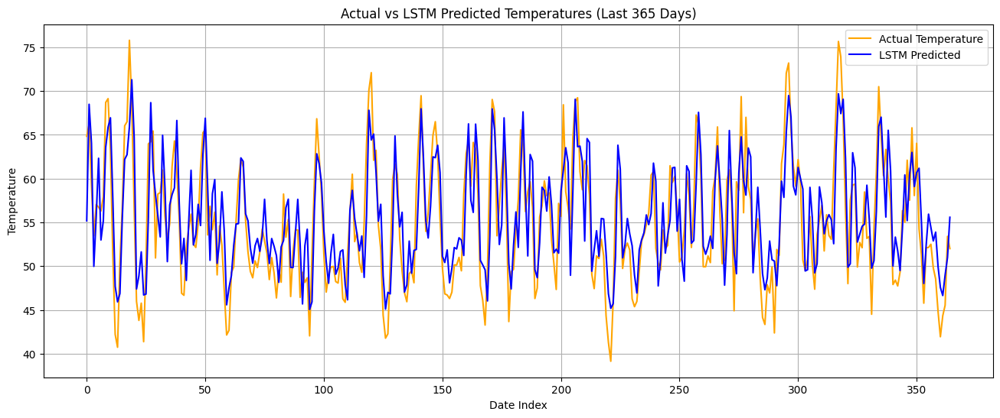

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_true.values[-365:], label="Actual Temperature", color='orange')
plt.plot(y_pred.values[-365:], label="LSTM Predicted", color='blue')
plt.title("Actual vs LSTM Predicted Temperatures (Last 365 Days)")
plt.xlabel("Date Index")
plt.ylabel("Temperature")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
from datetime import timedelta
from tqdm import tqdm
import pandas as pd
import numpy as np

final_us.index = pd.to_datetime(final_us.index)

city_map = final_us[['City_Encoded', 'City']].drop_duplicates().set_index('City_Encoded')['City'].to_dict()

city_forecasts_lstm = {}
unique_cities = final_us['City_Encoded'].unique()

for city_code in tqdm(unique_cities, desc="Generating LSTM Forecasts for Cities"):
    city_data = final_us[final_us['City_Encoded'] == city_code].copy()
    city_data = city_data.sort_index()

    last_seq = city_data[lstm_features].iloc[-30:].values
    forecasts = []

    for _ in range(10):
        pred_scaled = model.predict(last_seq[np.newaxis, :, :], verbose=0)[0, 0]
        pred_actual = (pred_scaled * lstm_std) + lstm_mean
        forecasts.append(pred_actual)

        next_row = last_seq[-1].copy()
        next_row[0] = pred_scaled
        last_seq = np.vstack([last_seq[1:], next_row])

    last_date = city_data.index[-1]
    future_dates = pd.date_range(start=last_date + timedelta(days=1), periods=10, freq='D')

    forecast_df = pd.DataFrame({'Date': future_dates, 'LSTM_Forecast': forecasts}).set_index('Date')
    city_name = city_map[city_code]
    city_forecasts_lstm[city_name] = forecast_df

print("All city-wise LSTM forecasts generated with proper datetime index.")

Generating LSTM Forecasts for Cities: 100%|██████████| 154/154 [01:56<00:00,  1.33it/s]

All city-wise LSTM forecasts generated with proper datetime index.


In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1995-01-01,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.934539,41.634814
1995-01-01,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.934539,41.634814
1995-01-01,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.934539,41.634814
1995-01-01,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.934539,41.634814
1995-01-01,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.934539,41.634814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-13,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.612867,46.863744
2020-05-13,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.677720,45.809521
2020-05-13,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.523868,48.310469


In [ ]:
final_us.to_csv('/content/drive/MyDrive/Final_Group2/Final_us_RF_XGBoost_LSTM.csv', index=False)

In [ ]:
import plotly.graph_objects as go

buttons = []
traces = []

for city_name, forecast in city_forecasts_lstm.items():
    city_data = final_us[final_us['City'] == city_name].copy()

    forecast.index = pd.to_datetime(forecast.index)

    actual_last_90 = city_data['smoothed_temp'].iloc[-90:]
    actual_last_90.index = pd.to_datetime(actual_last_90.index)

    last_actual_date = actual_last_90.index[-1]
    last_actual_value = actual_last_90.iloc[-1]

    forecast_with_continuity = pd.concat([
        pd.DataFrame({'LSTM_Forecast': [last_actual_value]}, index=[last_actual_date]),
        forecast
    ])

    traces.append(go.Scatter(x=actual_last_90.index, y=actual_last_90.values, mode='lines',
                             name=f'Actual - {city_name}', visible=False,
                             line=dict(color='blue')))

    traces.append(go.Scatter(x=forecast_with_continuity.index, y=forecast_with_continuity['LSTM_Forecast'],
                             mode='lines+markers', name=f'LSTM Forecast - {city_name}',
                             line=dict(dash='dot', color='red'), visible=False))

for i, city_name in enumerate(city_forecasts_lstm.keys()):
    vis = [False] * (len(city_forecasts_lstm) * 2)
    vis[2 * i] = True
    vis[2 * i + 1] = True
    buttons.append(dict(method='update', label=city_name, args=[{'visible': vis}]))

fig = go.Figure(traces)
fig.update_layout(
    updatemenus=[dict(type='dropdown', direction='down', buttons=buttons)],
    title='Interactive City-Wise LSTM Forecast',
    width=1500,
    height=600,
    xaxis_title="Date",
    yaxis_title="Temperature",
)

fig.show()


In [ ]:
final_us['Date'] = pd.to_datetime(final_us[['Year', 'Month', 'Day']])
df_pred_actual = final_us[['Date', 'smoothed_temp', 'LSTM_Predicted_Original']].copy()
df_pred_actual.rename(columns={
    'smoothed_temp': 'Actual Temperature',
    'LSTM_Predicted_Original': 'Predicted Temperature'
}, inplace=True)

df_pred_actual.dropna(subset=['Predicted Temperature'], inplace=True)

df_pred_actual['Date'] = pd.to_datetime(df_pred_actual['Date'])
df_pred_actual.set_index('Date', inplace=True)

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

lstm_error_summary = []

for city in final_us['City'].unique():
    city_data = final_us[final_us['City'] == city]
    actual = city_data['smoothed_temp']
    predicted = city_data['LSTM_Predicted_Original']

    if predicted.notna().sum() > 0:
        rmse = np.sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        r2 = r2_score(actual, predicted)
    else:
        rmse = mae = r2 = np.nan

    lstm_error_summary.append({
        'City': city,
        'LSTM_RMSE': rmse,
        'LSTM_MAE': mae,
        'LSTM_R2': r2
    })

lstm_errors_df = pd.DataFrame(lstm_error_summary)

In [ ]:
merged_df = merged_df.merge(lstm_errors_df, on='City', how='left')


In [ ]:
merged_df.to_csv('/content/drive/MyDrive/Final_Group2/error_summary_RF_XGB_LSTM.csv', index=False)


In [ ]:
merged_df

,City,RF_RMSE,RF_MAE,RF_R2,location,coordinates,latitude,longitude,XGB_RMSE,XGB_MAE,XGB_R2,LSTM_RMSE,LSTM_MAE,LSTM_R2
0,Great Falls,2.613973,1.784451,0.973037,"Great Falls, USA","(Great Falls, Cascade County, Montana, United ...",47.504885,-111.291890,4.582049,3.573113,0.917151,5.007314,3.943358,0.901059
1,Helena,2.593784,1.744382,0.975120,"Helena, USA","(Helena, Lewis and Clark County, Montana, Unit...",46.592742,-112.036277,4.402934,3.400936,0.928307,4.932271,3.907579,0.910033
2,Rapid City,2.569448,1.740810,0.976427,"Rapid City, USA","(Rapid City, Pennington County, South Dakota, ...",44.080604,-103.228023,4.348592,3.339703,0.932481,4.749680,3.706549,0.919451
3,Billings,2.559343,1.754592,0.975971,"Billings, USA","(Billings, Yellowstone County, Montana, United...",45.787496,-108.496070,4.425960,3.450064,0.928140,4.555780,3.513722,0.923863
4,Bismarck,2.496023,1.715541,0.979250,"Bismarck, USA","(Bismarck, Burleigh County, North Dakota, Unit...",46.808327,-100.783739,4.105927,3.191845,0.943852,5.583526,4.438643,0.896168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,Yuma,1.386741,1.071899,0.991528,"Yuma, USA","(Yuma, Yuma County, Arizona, United States, (3...",32.723268,-114.617995,3.326617,2.609537,0.951245,6.955497,6.586236,0.786857
150,Wilmington,1.383324,1.045512,0.992769,"Wilmington, USA","(Wilmington, New Castle County, Delaware, Unit...",39.745947,-75.546589,3.513161,2.674826,0.953360,2.443638,1.992008,0.977435
151,Harrisburg,1.365776,1.037733,0.993242,"Harrisburg, USA","(Harrisburg, Dauphin County, Pennsylvania, Uni...",40.266311,-76.886112,3.561764,2.726591,0.954041,2.599796,2.100081,0.975514
152,Daytona Beach,1.333458,1.016599,0.990808,"Daytona Beach, USA","(Daytona Beach, Volusia County, Florida, Unite...",29.210815,-81.022833,3.494106,2.683557,0.936885,5.282587,4.836125,0.855738


## ARIMA

In [ ]:
pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 93.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 117.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.9/232.9 kB 14.7 MB/s eta 0:00:00


In [ ]:
csv_file = "/content/drive/MyDrive/Final_Group2/Final_us_RF_XGBoost_LSTM.csv"
final_us = pd.read_csv(csv_file, encoding="utf-8", low_memory=False)
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original,Date
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.914446,41.961428,1995-01-01
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.914446,41.961428,1995-01-01
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.914446,41.961428,1995-01-01
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.914446,41.961428,1995-01-01
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.914446,41.961428,1995-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391,2020-05-13
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399,2020-05-13
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383,2020-05-13
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,0,1,0,0,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2.0,134.0,20.0,1,90,51.790000,52.614250,-0.358206,51.003379,2020-05-13


In [ ]:
final_us['Date'] = pd.to_datetime(final_us['Date'])
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original,Date
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.914446,41.961428,1995-01-01
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.914446,41.961428,1995-01-01
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.914446,41.961428,1995-01-01
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.914446,41.961428,1995-01-01
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.914446,41.961428,1995-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391,2020-05-13
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399,2020-05-13
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383,2020-05-13
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,0,1,0,0,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2.0,134.0,20.0,1,90,51.790000,52.614250,-0.358206,51.003379,2020-05-13


In [ ]:
from pmdarima import auto_arima
from tqdm import tqdm
import warnings
import joblib
import os

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

arima_params = {}
for city in tqdm(final_us['City'].unique(), desc="Selecting ARIMA parameters with extended search"):
    city_series = final_us[final_us['City'] == city].set_index('Date')['smoothed_temp'].dropna()

    model = auto_arima(city_series,
                       start_p=0, start_q=0,
                       max_p=4, max_q=4,
                       d=None,
                       seasonal=False,
                       trace=True,
                       error_action='ignore',
                       suppress_warnings=True,
                       stepwise=True)

    arima_params[city] = model.order

save_dir = "/content/drive/MyDrive/Final_Group2"
file_path = os.path.join(save_dir, "arima_params.pkl")
os.makedirs(save_dir, exist_ok=True)

joblib.dump(arima_params, file_path)
print(f"ARIMA parameter selection completed and saved at: {file_path}")

if os.path.exists(file_path):
    loaded_params = joblib.load(file_path)
    print("Successfully loaded ARIMA parameters. Sample:")
    print(dict(list(loaded_params.items())[:3]))
else:
    raise FileNotFoundError(f"Could not find saved ARIMA parameters at: {file_path}")


Selecting ARIMA parameters with extended search:   0%|          | 0/154 [00:00<?, ?it/s]

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102319.113, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91716.838, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62419.187, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62155.305, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62120.579, Time=1.92 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62117.664, Time=2.78 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62123.062, Time=3.17 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62119.371, Time=3.43 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=62092.819, Time=6.46 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=62096.128, Time=4.85 sec
 ARIMA(4,0,0)(0,0,0)[0] intercept   : AIC=

Selecting ARIMA parameters with extended search:   1%|          | 1/154 [00:40<1:42:27, 40.18s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62099.969, Time=5.99 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 40.067 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100786.260, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64785.655, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90200.955, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62272.810, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61993.030, Time=1.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61989.197, Time=1.93 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61991.195, Time=2.41 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61996.764, Time=1.47 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61989.360, Time=2.02 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.73 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:   1%|▏         | 2/154 [01:24<1:48:10, 42.70s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61969.194, Time=3.44 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.346 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101896.450, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91242.339, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62293.813, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62006.227, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61983.694, Time=1.77 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61985.641, Time=2.91 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62004.506, Time=3.51 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61985.770, Time=2.34 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.67 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   2%|▏         | 3/154 [02:17<1:59:21, 47.43s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61963.732, Time=6.81 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 52.939 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101264.687, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90641.315, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61895.061, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61643.905, Time=1.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61627.497, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61629.308, Time=2.85 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61647.810, Time=1.93 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61628.374, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.77 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   3%|▎         | 4/154 [03:06<1:59:27, 47.78s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61604.913, Time=5.84 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.210 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102100.370, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91449.928, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61735.250, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61505.245, Time=1.25 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61486.947, Time=2.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61488.822, Time=2.82 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61488.947, Time=3.25 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61488.650, Time=1.86 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   3%|▎         | 5/154 [03:53<1:58:04, 47.55s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61464.066, Time=4.18 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 47.019 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99879.774, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64037.562, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89408.849, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61491.868, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61296.057, Time=1.20 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61277.590, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61277.850, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.14 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61276.699, Time=2.26 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=61330.543, Time=0.55 sec
 ARIMA(2,0,3)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:   4%|▍         | 6/154 [04:43<1:59:26, 48.42s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61257.423, Time=4.06 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 50.004 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100909.346, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90307.009, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61697.720, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61524.817, Time=1.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61498.062, Time=1.73 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61499.764, Time=2.55 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61528.809, Time=1.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61501.113, Time=2.27 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   5%|▍         | 7/154 [05:34<2:00:46, 49.29s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61481.362, Time=4.77 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 50.974 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102008.126, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91307.170, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61990.034, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61713.436, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61704.884, Time=1.76 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61706.852, Time=2.69 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61717.263, Time=2.23 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61705.284, Time=1.90 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   5%|▌         | 8/154 [06:20<1:57:46, 48.40s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61685.103, Time=4.54 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.380 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101868.302, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91163.287, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61947.524, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61699.374, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61679.194, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61681.110, Time=2.65 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61703.308, Time=1.31 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61681.435, Time=2.14 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   6%|▌         | 9/154 [07:02<1:51:33, 46.16s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61656.826, Time=3.99 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 41.131 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101260.344, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90598.963, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59699.427, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59639.711, Time=0.55 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59639.549, Time=2.26 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59640.714, Time=2.52 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59643.515, Time=0.78 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59639.143, Time=2.45 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=59642.313, Time=0.54 sec
 ARIMA(2,0,3)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:   6%|▋         | 10/154 [07:41<1:45:39, 44.03s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=59618.609, Time=3.10 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 39.131 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102049.912, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91408.554, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62152.909, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61904.237, Time=1.25 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61888.290, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61888.908, Time=2.55 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61901.371, Time=0.85 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61891.141, Time=2.09 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   7%|▋         | 11/154 [08:27<1:46:11, 44.56s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61866.905, Time=4.16 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.647 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=97316.638, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=87049.961, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=58794.261, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=58678.569, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=58651.776, Time=1.73 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=58652.980, Time=2.29 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=58653.180, Time=3.48 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=58652.860, Time=2.15 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:   8%|▊         | 12/154 [09:11<1:45:19, 44.50s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=58632.296, Time=3.53 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.273 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102141.901, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91546.596, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60086.518, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60048.621, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60033.340, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60034.687, Time=2.82 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60035.945, Time=3.76 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=1.57 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:   8%|▊         | 13/154 [09:55<1:44:26, 44.45s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60013.745, Time=4.05 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.207 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100288.301, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89757.432, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61906.071, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61611.215, Time=1.30 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61594.902, Time=1.96 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61596.825, Time=2.84 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61610.922, Time=1.31 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61596.259, Time=1.84 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:   9%|▉         | 14/154 [10:40<1:44:00, 44.57s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61576.872, Time=3.51 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.760 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99460.694, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=88939.886, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61205.168, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61007.638, Time=1.29 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60984.917, Time=1.84 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60981.701, Time=2.46 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=60986.904, Time=2.96 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61010.892, Time=1.88 sec
 ARIMA(4,0,1)(0,0,0)[0] intercep

Selecting ARIMA parameters with extended search:  10%|▉         | 15/154 [12:05<2:11:14, 56.65s/it]

 ARIMA(2,0,4)(0,0,0)[0]             : AIC=60968.216, Time=1.68 sec

Best model:  ARIMA(2,0,4)(0,0,0)[0] intercept
Total fit time: 84.514 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=96092.115, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=85979.532, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=58354.298, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=58264.612, Time=1.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=58228.778, Time=1.64 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=58226.224, Time=2.27 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.60 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=58228.667, Time=1.74 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=58268.469, Time=1.81 sec
 ARIMA(4,0,1)(0,0,0)[0] intercep

Selecting ARIMA parameters with extended search:  10%|█         | 16/154 [12:35<1:51:58, 48.68s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=58244.380, Time=3.67 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 30.076 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101371.413, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90793.261, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60904.767, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60823.964, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60809.817, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60811.805, Time=2.65 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60823.184, Time=3.32 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60907.496, Time=1.36 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  11%|█         | 17/154 [13:24<1:51:10, 48.69s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60794.129, Time=5.51 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.592 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100574.330, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64946.493, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90045.654, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62321.221, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62081.569, Time=1.34 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62056.226, Time=1.83 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62057.863, Time=2.45 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62084.690, Time=1.50 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62057.867, Time=1.96 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  12%|█▏        | 18/154 [14:18<1:53:59, 50.29s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=inf, Time=6.45 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 53.920 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101247.367, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90755.901, Time=0.58 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61508.349, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61329.285, Time=1.15 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61308.048, Time=1.87 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61306.907, Time=2.74 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61302.259, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61307.636, Time=3.32 sec
 ARIMA(4,0,3)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  12%|█▏        | 19/154 [15:12<1:55:32, 51.35s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61281.022, Time=6.42 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 53.700 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100798.273, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64738.172, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90273.037, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62238.359, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61969.617, Time=1.21 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61956.067, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61957.272, Time=2.43 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61968.479, Time=1.32 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61958.035, Time=1.94 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.71 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  13%|█▎        | 20/154 [15:58<1:51:31, 49.93s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61936.812, Time=4.22 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.519 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102337.800, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91760.375, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62321.964, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62091.825, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62065.293, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62062.937, Time=2.55 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61944.388, Time=4.17 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62063.920, Time=3.26 sec
 ARIMA(4,0,3)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  14%|█▎        | 21/154 [16:29<1:37:45, 44.10s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62039.177, Time=6.51 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0]          
Total fit time: 30.395 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100009.818, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64200.188, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89600.073, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61485.949, Time=0.67 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61265.696, Time=1.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61248.710, Time=1.98 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61247.012, Time=2.36 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61252.593, Time=3.13 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61262.780, Time=3.57 sec
 ARIMA(4,0,1)(0,0,0)[0] i

Selecting ARIMA parameters with extended search:  14%|█▍        | 22/154 [17:05<1:31:44, 41.70s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61240.095, Time=5.73 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 35.985 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101233.448, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90576.923, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61635.500, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61428.536, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61388.656, Time=2.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61390.162, Time=2.61 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61390.383, Time=3.12 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61396.659, Time=2.30 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  15%|█▍        | 23/154 [18:06<1:43:40, 47.49s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61374.150, Time=6.56 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 60.880 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101878.354, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91293.266, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61862.259, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61735.681, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61690.726, Time=2.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61692.466, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=4.61 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61749.193, Time=3.52 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  16%|█▌        | 24/154 [18:52<1:41:59, 47.07s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61670.206, Time=3.55 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.990 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101602.637, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91001.925, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62026.649, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61771.360, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61753.048, Time=1.91 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61752.749, Time=2.93 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61755.966, Time=2.28 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61767.316, Time=0.83 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  16%|█▌        | 25/154 [19:25<1:32:09, 42.87s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61733.366, Time=6.05 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 32.948 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102023.830, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91333.357, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62324.280, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62020.288, Time=1.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61995.580, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61994.022, Time=2.50 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61996.729, Time=3.77 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61995.290, Time=2.90 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  17%|█▋        | 26/154 [20:04<1:29:17, 41.86s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61971.969, Time=5.92 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 39.383 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101908.171, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91235.367, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60178.574, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60093.066, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60078.773, Time=2.06 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60080.647, Time=2.90 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60090.471, Time=2.01 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60182.449, Time=1.44 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  18%|█▊        | 27/154 [20:51<1:31:24, 43.18s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60057.416, Time=6.76 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.166 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101705.602, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91102.592, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60975.863, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60879.483, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60873.113, Time=2.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60871.875, Time=2.55 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=60875.302, Time=2.34 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60873.871, Time=1.53 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  18%|█▊        | 28/154 [21:21<1:22:37, 39.34s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=60855.200, Time=2.72 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 30.276 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=203967.730, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=132239.659, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=183165.448, Time=0.95 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=124094.115, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=124093.253, Time=2.12 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=123808.009, Time=3.54 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.47 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=123671.974, Time=4.97 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=123725.380, Time=8.50 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=124094.243, Time=3.50 sec
 ARIMA(4,0,1)(0,0

Selecting ARIMA parameters with extended search:  19%|█▉        | 29/154 [23:53<2:32:14, 73.08s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=124035.078, Time=27.31 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 151.662 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100895.667, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64769.988, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90446.627, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62054.235, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61859.509, Time=1.26 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61835.216, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61837.187, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61837.649, Time=3.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61837.844, Time=2.19 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0

Selecting ARIMA parameters with extended search:  19%|█▉        | 30/154 [24:42<2:16:27, 66.03s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61814.088, Time=6.45 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.419 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101092.866, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90460.089, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61792.538, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61545.004, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61537.808, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61539.789, Time=2.50 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61544.321, Time=2.26 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61537.985, Time=1.90 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  20%|██        | 31/154 [25:24<2:00:01, 58.55s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61518.851, Time=3.43 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 40.999 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100939.028, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64870.707, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90504.310, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62270.899, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62058.726, Time=1.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62040.515, Time=1.88 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62042.072, Time=2.53 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62034.903, Time=2.34 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62042.010, Time=2.18 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62035.085, Time=3.74 sec
 ARIMA(3,0,3)(0,0,0

Selecting ARIMA parameters with extended search:  21%|██        | 32/154 [26:51<2:16:34, 67.17s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=62013.876, Time=7.12 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 87.160 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100889.005, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90400.257, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61424.548, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61272.613, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61258.152, Time=1.72 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61260.007, Time=2.44 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61260.490, Time=3.31 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61260.102, Time=1.99 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  21%|██▏       | 33/154 [27:34<2:01:02, 60.02s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61238.756, Time=4.01 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.222 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102330.972, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91674.534, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62535.320, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62195.281, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62178.606, Time=2.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62178.087, Time=2.66 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62179.993, Time=1.16 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62177.427, Time=3.29 sec
 ARIMA(2,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  22%|██▏       | 34/154 [28:48<2:08:20, 64.17s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=62156.982, Time=6.18 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 73.758 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101578.043, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91041.595, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62407.080, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62197.781, Time=1.29 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62191.647, Time=1.88 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62191.391, Time=2.50 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62194.201, Time=2.18 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62193.515, Time=1.43 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  23%|██▎       | 35/154 [30:03<2:13:50, 67.48s/it]

 ARIMA(4,0,3)(0,0,0)[0]             : AIC=62188.862, Time=3.68 sec

Best model:  ARIMA(4,0,3)(0,0,0)[0] intercept
Total fit time: 75.089 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=62831.745, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=56335.728, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=38199.728, Time=0.50 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38138.567, Time=0.78 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=38115.437, Time=1.19 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=38117.420, Time=1.65 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=38131.057, Time=2.18 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=38203.728, Time=0.82 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  23%|██▎       | 36/154 [30:35<1:51:41, 56.79s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=38104.268, Time=3.77 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 31.740 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101059.485, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90494.569, Time=0.56 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62549.120, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62261.683, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62246.751, Time=1.78 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62247.994, Time=2.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62247.792, Time=3.20 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62248.348, Time=2.19 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  24%|██▍       | 37/154 [31:19<1:43:27, 53.06s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62225.661, Time=3.63 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.235 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102017.304, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91236.119, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59730.139, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59666.137, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59658.922, Time=2.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59659.395, Time=2.82 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.35 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59658.208, Time=2.75 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=59670.371, Time=0.56 sec
 ARIMA(2,0,3)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  25%|██▍       | 38/154 [32:15<1:44:08, 53.87s/it]

 ARIMA(1,0,4)(0,0,0)[0]             : AIC=59659.397, Time=1.06 sec

Best model:  ARIMA(1,0,4)(0,0,0)[0] intercept
Total fit time: 55.657 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101505.914, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90894.980, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62958.963, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62627.648, Time=1.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62615.432, Time=2.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62616.754, Time=2.72 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62617.074, Time=3.33 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62616.855, Time=2.04 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  25%|██▌       | 39/154 [33:05<1:40:59, 52.69s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62594.341, Time=4.34 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.816 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100037.076, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64035.103, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89625.753, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60205.175, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60174.000, Time=0.59 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60166.795, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60168.767, Time=2.77 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60171.049, Time=3.73 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60208.376, Time=0.95 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.71 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  26%|██▌       | 40/154 [33:49<1:35:21, 50.19s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60149.125, Time=3.56 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.245 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100274.058, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89874.392, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61254.381, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61098.301, Time=1.38 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61046.831, Time=1.78 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61048.754, Time=2.80 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61050.161, Time=3.68 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61258.372, Time=0.90 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  27%|██▋       | 41/154 [34:36<1:32:31, 49.13s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.02 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.539 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101133.482, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90598.304, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61899.496, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61679.943, Time=1.35 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61671.917, Time=1.91 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61672.814, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61673.112, Time=3.47 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61673.367, Time=2.00 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  27%|██▋       | 42/154 [35:20<1:28:48, 47.58s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61653.316, Time=3.61 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.853 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101297.800, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90760.710, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60569.880, Time=0.61 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60523.410, Time=1.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60513.281, Time=1.83 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60515.084, Time=2.39 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60515.008, Time=2.71 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60515.749, Time=2.75 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  28%|██▊       | 43/154 [36:05<1:26:30, 46.76s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60495.948, Time=3.53 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.743 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=82525.785, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=73833.440, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=49235.024, Time=0.59 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=49217.549, Time=0.42 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=49219.504, Time=1.63 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=49219.520, Time=1.97 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=49217.989, Time=0.43 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=49221.547, Time=1.17 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=49199.197, Time=1.69 sec
 ARIMA(1,0,1)(0,0,0)[0] in

Selecting ARIMA parameters with extended search:  29%|██▊       | 44/154 [36:33<1:15:27, 41.16s/it]

 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=49203.075, Time=1.89 sec

Best model:  ARIMA(1,0,2)(0,0,0)[0] intercept
Total fit time: 27.982 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=201839.912, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=131572.711, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=181188.618, Time=1.00 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=122233.473, Time=0.66 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=122232.388, Time=0.99 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=122189.634, Time=4.20 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=122120.271, Time=4.80 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=122115.113, Time=8.02 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=122234.487, Time=3.78 sec
 ARIMA(4,0,3)(0,0

Selecting ARIMA parameters with extended search:  29%|██▉       | 45/154 [37:50<1:34:21, 51.94s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=122120.154, Time=33.99 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0]          
Total fit time: 76.988 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=98639.692, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=62922.546, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=88261.409, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59361.467, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59309.497, Time=0.51 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59310.995, Time=1.98 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59311.004, Time=2.31 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=59311.078, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59313.427, Time=1.28 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=59290.464, Time=2.42 sec
 ARIMA(1,0,1)(0,0,

Selecting ARIMA parameters with extended search:  30%|██▉       | 46/154 [38:20<1:21:24, 45.23s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=59294.447, Time=2.59 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 29.385 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101009.021, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90359.110, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59846.988, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59782.056, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59775.262, Time=1.77 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59776.399, Time=2.60 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59784.655, Time=1.36 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59775.126, Time=2.91 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=59786.181, Time=0.55 sec
 ARIMA(2,0,3)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  31%|███       | 47/154 [39:08<1:22:03, 46.01s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=59756.346, Time=4.20 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 47.729 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100785.983, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90249.988, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60339.091, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60256.033, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60246.001, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60247.941, Time=2.54 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60251.978, Time=1.60 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60246.967, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  31%|███       | 48/154 [39:47<1:17:45, 44.01s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60227.481, Time=3.88 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 39.240 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=68169.508, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=60991.330, Time=0.37 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=39172.487, Time=0.29 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=39156.277, Time=0.36 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=39157.221, Time=1.41 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=39157.237, Time=2.09 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=39156.868, Time=0.38 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=39155.865, Time=1.37 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=39158.814, Time=1.64 sec
 ARIMA(3,0,3)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:  32%|███▏      | 49/154 [40:34<1:18:46, 45.01s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=39141.521, Time=5.17 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 47.236 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100880.614, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64719.069, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90344.910, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62392.348, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62053.325, Time=1.27 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62033.559, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62033.823, Time=2.88 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62049.987, Time=3.58 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62037.122, Time=2.30 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  32%|███▏      | 50/154 [41:25<1:20:50, 46.64s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62012.995, Time=6.47 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 50.339 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101204.385, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90658.288, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61769.507, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61544.287, Time=1.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61520.280, Time=1.90 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61519.244, Time=2.60 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61522.796, Time=2.39 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61520.370, Time=3.32 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  33%|███▎      | 51/154 [41:59<1:13:52, 43.04s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61498.415, Time=6.10 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 34.520 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100992.420, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64974.180, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90453.788, Time=0.51 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62479.309, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62216.506, Time=1.11 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62208.027, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62209.563, Time=2.61 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62216.409, Time=1.40 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62207.473, Time=1.81 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=62256.215, Time=0.56 sec
 ARIMA(2,0,3)(0,0,0

Selecting ARIMA parameters with extended search:  34%|███▍      | 52/154 [42:53<1:18:22, 46.10s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=62187.055, Time=4.36 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 53.130 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102602.816, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91878.754, Time=0.56 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61762.345, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61517.194, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61502.653, Time=2.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61504.147, Time=2.95 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.06 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61504.800, Time=2.31 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  34%|███▍      | 53/154 [43:41<1:18:37, 46.71s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61482.935, Time=3.83 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.025 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102172.663, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91434.605, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62291.712, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62015.035, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62009.501, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.50 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62011.493, Time=2.89 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62018.998, Time=1.67 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62009.868, Time=1.99 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  35%|███▌      | 54/154 [44:24<1:15:55, 45.56s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61988.555, Time=4.34 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.752 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101001.958, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65181.726, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90525.314, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62796.003, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62522.554, Time=1.32 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62490.846, Time=1.81 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.53 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62492.769, Time=2.61 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62492.958, Time=3.57 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62494.107, Time=1.91 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.76 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  36%|███▌      | 55/154 [45:11<1:16:09, 46.16s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62470.016, Time=4.08 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 47.459 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102294.709, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91590.982, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61862.036, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61581.508, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61565.478, Time=1.91 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61557.454, Time=2.53 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61569.451, Time=3.12 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61562.916, Time=3.17 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  36%|███▋      | 56/154 [45:49<1:11:21, 43.69s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61546.154, Time=6.07 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.813 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101868.839, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91261.593, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62023.738, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61863.477, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61850.918, Time=2.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61852.423, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61865.630, Time=2.09 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61851.671, Time=2.35 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  37%|███▋      | 57/154 [46:36<1:12:07, 44.61s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.39 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.665 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102142.588, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91418.515, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62316.040, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61970.515, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61948.800, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61948.012, Time=2.41 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61950.298, Time=2.40 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61947.754, Time=2.83 sec
 ARIMA(2,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  38%|███▊      | 58/154 [47:40<1:20:53, 50.56s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=61929.800, Time=4.65 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 64.318 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103351.460, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92414.471, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60112.640, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60035.781, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60032.412, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60033.584, Time=2.59 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60037.413, Time=1.47 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60033.196, Time=2.62 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  38%|███▊      | 59/154 [48:37<1:23:03, 52.45s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=60014.199, Time=5.76 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 56.766 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99816.723, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89414.384, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61228.097, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61112.696, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61061.769, Time=1.77 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61055.807, Time=2.57 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61064.941, Time=2.06 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61056.976, Time=3.80 sec
 ARIMA(4,0,1)(0,0,0)[0] intercep

Selecting ARIMA parameters with extended search:  39%|███▉      | 60/154 [49:14<1:15:05, 47.93s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61040.862, Time=6.34 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.276 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101212.520, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65430.224, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90705.934, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=63101.491, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62779.005, Time=1.25 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62767.991, Time=2.10 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62768.079, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62770.618, Time=1.54 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62769.587, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  40%|███▉      | 61/154 [49:56<1:11:07, 45.89s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62744.403, Time=6.10 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 41.003 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102380.734, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91656.070, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60232.998, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60178.493, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60177.026, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60178.352, Time=2.60 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60179.635, Time=0.74 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60177.523, Time=2.48 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  40%|████      | 62/154 [50:59<1:18:27, 51.17s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=60161.744, Time=7.40 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 63.385 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100319.846, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64589.718, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89783.341, Time=0.56 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62278.629, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61959.629, Time=1.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61955.835, Time=1.87 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61957.834, Time=2.41 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61963.335, Time=1.55 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61955.974, Time=1.93 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  41%|████      | 63/154 [51:38<1:11:56, 47.43s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61936.204, Time=3.41 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 38.594 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=203636.685, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=132377.883, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=183076.130, Time=0.91 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=124298.895, Time=0.60 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=124300.583, Time=2.03 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=124300.631, Time=2.28 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=169839.214, Time=1.84 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=124287.399, Time=1.28 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=123995.810, Time=6.87 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=124024.944, Time=4.34 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=123896.796, Time=8.39 sec
 AR

Selecting ARIMA parameters with extended search:  42%|████▏     | 64/154 [54:17<2:01:40, 81.12s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=124092.241, Time=25.85 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 159.577 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102286.431, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91545.977, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62371.601, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62086.968, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62070.486, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62071.705, Time=2.75 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62078.955, Time=1.64 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62072.643, Time=1.83 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]     

Selecting ARIMA parameters with extended search:  42%|████▏     | 65/154 [54:58<1:42:20, 68.99s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62048.966, Time=4.25 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 40.554 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101306.527, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65168.791, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90682.761, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=63027.993, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62661.270, Time=1.29 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62645.742, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62647.738, Time=2.73 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62662.769, Time=2.77 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62646.855, Time=2.16 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  43%|████▎     | 66/154 [55:47<1:32:23, 62.99s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62624.461, Time=6.36 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.883 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=38554.627, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=34486.427, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=23126.784, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=23100.304, Time=0.24 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=23100.580, Time=0.90 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=23099.634, Time=1.07 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=23102.272, Time=0.24 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=23104.307, Time=0.35 sec
 ARIMA(2,0,3)(0,0,0)[0]             : AIC=23104.987, Time=0.75 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=23101.726, Time=0.35 sec
 ARIMA(3,0,3)(0,0,0)

Selecting ARIMA parameters with extended search:  44%|████▎     | 67/154 [56:07<1:12:40, 50.12s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=23094.229, Time=2.88 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 19.969 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102111.965, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91481.455, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62381.057, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62139.237, Time=1.25 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62119.298, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62120.948, Time=2.53 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62121.280, Time=3.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62122.070, Time=2.09 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  44%|████▍     | 68/154 [56:56<1:11:21, 49.79s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62099.127, Time=4.23 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.914 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101043.524, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65079.035, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90520.735, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62575.627, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62339.029, Time=1.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62318.084, Time=1.83 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62319.303, Time=2.65 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62341.893, Time=1.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62318.062, Time=2.18 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=62383.199, Time=1.18 sec
 ARIMA(2,0,3)(0,0,0

Selecting ARIMA parameters with extended search:  45%|████▍     | 69/154 [57:57<1:15:19, 53.17s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62297.927, Time=3.47 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 60.951 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=45694.846, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.11 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=40884.219, Time=0.18 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=26532.704, Time=0.14 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=26512.265, Time=0.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=26507.231, Time=0.92 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=26508.598, Time=1.19 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=26515.115, Time=1.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=26514.050, Time=1.44 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  45%|████▌     | 70/154 [58:19<1:01:10, 43.70s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=26500.958, Time=1.79 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 21.491 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99977.673, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89627.038, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60898.322, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60794.976, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60775.547, Time=1.81 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60774.612, Time=2.43 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=60773.221, Time=3.98 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60782.307, Time=3.11 sec
 ARIMA(4,0,3)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  46%|████▌     | 71/154 [59:52<1:20:52, 58.47s/it]

 ARIMA(4,0,4)(0,0,0)[0] intercept   : AIC=60751.761, Time=9.14 sec

Best model:  ARIMA(3,0,3)(0,0,0)[0] intercept
Total fit time: 92.802 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100975.803, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65260.566, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90438.358, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=63042.617, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62668.553, Time=1.35 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62659.331, Time=1.91 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62661.029, Time=2.59 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62671.064, Time=1.44 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62660.101, Time=2.10 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  47%|████▋     | 72/154 [1:00:34<1:13:03, 53.46s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62639.411, Time=3.65 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 41.663 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102860.078, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92023.413, Time=0.45 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60178.751, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60119.164, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60109.622, Time=1.98 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60111.019, Time=2.76 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60119.720, Time=0.72 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60111.703, Time=2.58 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  47%|████▋     | 73/154 [1:01:29<1:13:00, 54.07s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=60092.499, Time=6.92 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 55.403 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102017.193, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91352.041, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62044.355, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61838.270, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61797.544, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61799.406, Time=2.56 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61799.432, Time=3.19 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61801.224, Time=2.22 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.71 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  48%|████▊     | 74/154 [1:02:18<1:09:54, 52.44s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61777.843, Time=3.81 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.510 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102348.583, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91637.309, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61643.441, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61431.999, Time=1.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61412.491, Time=1.96 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61412.991, Time=2.47 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61413.565, Time=3.60 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61416.370, Time=2.24 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  49%|████▊     | 75/154 [1:03:06<1:07:31, 51.28s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61392.593, Time=3.86 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.477 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101121.064, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90628.235, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60782.396, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60720.615, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60712.046, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60714.042, Time=2.56 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60716.485, Time=3.11 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60786.308, Time=1.44 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.49 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  49%|████▉     | 76/154 [1:03:55<1:05:49, 50.63s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60692.393, Time=5.20 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.013 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102958.765, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92227.452, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60505.974, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60462.045, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60451.977, Time=2.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60453.763, Time=2.66 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60459.164, Time=2.14 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60509.169, Time=1.10 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  50%|█████     | 77/154 [1:04:39<1:02:13, 48.49s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60432.980, Time=6.35 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.370 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102391.080, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91659.857, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61484.724, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61262.864, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61243.390, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61244.479, Time=2.57 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61244.826, Time=3.43 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61246.765, Time=1.85 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.51 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  51%|█████     | 78/154 [1:05:28<1:01:30, 48.56s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61223.610, Time=6.56 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.626 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=98188.711, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=62920.531, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=87865.171, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60065.606, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59899.950, Time=1.19 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59892.986, Time=2.06 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59894.362, Time=2.26 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.54 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59894.474, Time=1.92 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  51%|█████▏    | 79/154 [1:06:12<59:01, 47.22s/it]  

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=6.82 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.994 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=202624.950, Time=0.19 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=181583.147, Time=0.86 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=122424.235, Time=0.66 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=122409.544, Time=2.06 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=122100.428, Time=3.76 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=121967.456, Time=6.01 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.56 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=122040.106, Time=8.00 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=122412.060, Time=3.65 sec
 ARIMA(4,0,1)(0,0,0)[0] interc

Selecting ARIMA parameters with extended search:  52%|█████▏    | 80/154 [1:08:24<1:29:32, 72.60s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=122341.045, Time=11.54 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 131.683 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100269.180, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89827.062, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61777.716, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61573.428, Time=1.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61535.148, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61532.964, Time=2.71 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.77 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=inf, Time=2.90 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=5.32 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AI

Selecting ARIMA parameters with extended search:  53%|█████▎    | 81/154 [1:09:03<1:16:12, 62.64s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61529.682, Time=6.05 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 39.254 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100114.035, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64360.336, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89718.901, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61713.546, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61483.694, Time=1.18 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61467.778, Time=1.66 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61467.791, Time=2.71 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=4.29 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61471.315, Time=2.10 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  53%|█████▎    | 82/154 [1:09:45<1:07:45, 56.47s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61454.197, Time=5.42 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 41.951 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102000.775, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91310.893, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61848.754, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61636.461, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61614.344, Time=1.93 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61615.718, Time=2.44 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=3.32 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61618.871, Time=2.34 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  54%|█████▍    | 83/154 [1:11:06<1:15:28, 63.78s/it]

 ARIMA(4,0,3)(0,0,0)[0]             : AIC=61604.703, Time=4.45 sec

Best model:  ARIMA(4,0,3)(0,0,0)[0] intercept
Total fit time: 80.731 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102610.672, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91816.944, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61973.349, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61700.876, Time=1.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61685.854, Time=1.81 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61687.423, Time=2.64 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61704.679, Time=1.50 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61687.940, Time=2.33 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  55%|█████▍    | 84/154 [1:11:47<1:06:22, 56.90s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61665.084, Time=4.25 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 40.719 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101488.186, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90839.387, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61951.288, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61702.689, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61690.264, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61691.998, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=1.72 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61690.431, Time=2.09 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  55%|█████▌    | 85/154 [1:12:27<59:49, 52.02s/it]  

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61670.596, Time=4.56 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 40.519 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101130.409, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.16 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90644.351, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61865.414, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61650.421, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61634.819, Time=1.90 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61633.090, Time=2.62 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61632.976, Time=2.11 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61630.759, Time=2.95 sec
 ARIMA(2,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  56%|█████▌    | 86/154 [1:13:40<1:05:59, 58.23s/it]

 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=61611.617, Time=5.24 sec

Best model:  ARIMA(3,0,2)(0,0,0)[0] intercept
Total fit time: 72.596 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100923.329, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64834.454, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90348.156, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62492.424, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62192.737, Time=1.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62175.340, Time=1.76 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62176.266, Time=2.33 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62176.795, Time=3.36 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62177.918, Time=1.91 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  56%|█████▋    | 87/154 [1:14:24<1:00:06, 53.82s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62155.028, Time=4.01 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.425 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101055.365, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64906.548, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90511.479, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62322.227, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62104.258, Time=1.31 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62089.631, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62091.431, Time=2.56 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62106.113, Time=1.49 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62089.766, Time=2.23 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  57%|█████▋    | 88/154 [1:15:09<56:24, 51.28s/it]  

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62070.140, Time=4.21 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.229 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101986.674, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91374.248, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62012.969, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61807.064, Time=1.26 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61790.785, Time=2.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61792.783, Time=2.44 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=3.79 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61792.344, Time=2.24 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  58%|█████▊    | 89/154 [1:15:54<53:37, 49.50s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61769.569, Time=4.24 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.248 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102698.808, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91979.677, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61749.068, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61452.950, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61432.861, Time=2.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61428.054, Time=2.57 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61435.177, Time=3.82 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61431.159, Time=3.37 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  58%|█████▊    | 90/154 [1:16:34<49:29, 46.39s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61413.281, Time=5.93 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 39.022 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100829.477, Time=0.08 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64925.658, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90304.931, Time=0.50 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62570.633, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62320.662, Time=1.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62287.408, Time=1.63 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62288.568, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62324.229, Time=2.07 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62288.561, Time=1.99 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.71 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  59%|█████▉    | 91/154 [1:17:23<49:36, 47.25s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62266.633, Time=6.05 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.144 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100637.833, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90116.482, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60891.146, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60791.764, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60770.291, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60772.282, Time=2.41 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60772.284, Time=3.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60773.560, Time=2.60 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  60%|█████▉    | 92/154 [1:18:08<48:14, 46.68s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60753.185, Time=3.65 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.232 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101176.610, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90532.277, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62511.677, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62202.840, Time=1.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62189.175, Time=2.01 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62190.854, Time=2.88 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62206.839, Time=1.48 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62189.319, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  60%|██████    | 93/154 [1:18:50<46:06, 45.36s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62168.370, Time=4.34 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.157 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100911.776, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64876.662, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90423.443, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62405.756, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62177.017, Time=1.27 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62135.146, Time=1.92 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62136.918, Time=2.83 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62159.968, Time=3.72 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62139.583, Time=2.22 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  61%|██████    | 94/154 [1:19:41<46:53, 46.89s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62115.936, Time=4.19 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 50.367 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101680.923, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91075.158, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62723.887, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62411.633, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62409.079, Time=1.92 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62410.002, Time=2.71 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62412.864, Time=0.86 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62409.536, Time=1.87 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  62%|██████▏   | 95/154 [1:20:23<44:46, 45.53s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62389.332, Time=4.00 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.256 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102704.611, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91893.380, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61353.714, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61125.893, Time=1.30 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61103.613, Time=2.06 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61104.227, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61104.953, Time=3.16 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61108.019, Time=2.11 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  62%|██████▏   | 96/154 [1:21:13<45:16, 46.84s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61081.430, Time=6.33 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.758 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100978.681, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90323.470, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61764.308, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61569.823, Time=1.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61549.459, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61547.723, Time=2.45 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61546.292, Time=4.09 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61573.712, Time=2.01 sec
 ARIMA(4,0,3)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  63%|██████▎   | 97/154 [1:22:07<46:33, 49.02s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61524.930, Time=6.49 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 53.997 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102542.100, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91890.872, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62310.743, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62041.277, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62020.800, Time=2.10 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62021.991, Time=2.47 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62022.687, Time=3.41 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62023.773, Time=2.21 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  64%|██████▎   | 98/154 [1:22:55<45:18, 48.55s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61999.231, Time=4.48 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 47.339 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101795.817, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91208.437, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62292.321, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62064.345, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62019.748, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62021.649, Time=2.59 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62022.281, Time=3.32 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62026.251, Time=2.06 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  64%|██████▍   | 99/154 [1:23:41<43:55, 47.93s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61998.785, Time=3.72 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.364 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100362.302, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89874.891, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61836.418, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61584.957, Time=1.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61558.206, Time=2.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61560.104, Time=2.65 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61582.775, Time=3.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61560.345, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  65%|██████▍   | 100/154 [1:24:31<43:46, 48.65s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61539.548, Time=5.56 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 50.219 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102852.447, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92025.880, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61552.495, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61279.052, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61266.716, Time=1.98 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61267.756, Time=2.66 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61279.722, Time=1.55 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61268.608, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  66%|██████▌   | 101/154 [1:25:18<42:19, 47.92s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61246.931, Time=4.35 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.108 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101516.585, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90914.627, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62909.790, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62564.232, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62546.846, Time=1.86 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62548.708, Time=2.89 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62568.003, Time=2.24 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62548.267, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  66%|██████▌   | 102/154 [1:26:04<41:05, 47.41s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=4.63 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.107 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100863.920, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90293.599, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62085.744, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61820.306, Time=1.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61774.093, Time=1.92 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61774.983, Time=2.59 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61824.003, Time=2.17 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61783.228, Time=2.17 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  67%|██████▋   | 103/154 [1:26:52<40:35, 47.76s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61754.396, Time=6.20 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.485 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101387.151, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90702.517, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60747.279, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60636.351, Time=0.57 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60627.377, Time=2.08 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60627.798, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60638.615, Time=1.95 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60626.777, Time=2.52 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=60646.557, Time=0.53 sec
 ARIMA(2,0,3)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  68%|██████▊   | 104/154 [1:27:42<40:10, 48.22s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=60609.643, Time=4.04 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 49.168 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101844.482, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91239.558, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62765.911, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62450.588, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62435.793, Time=1.95 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62433.938, Time=2.20 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62436.464, Time=2.26 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62436.506, Time=1.34 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  68%|██████▊   | 105/154 [1:28:16<36:03, 44.15s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62411.652, Time=5.97 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 34.539 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100929.143, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64852.059, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90310.830, Time=0.52 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62528.932, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62219.093, Time=1.28 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62208.631, Time=2.02 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62210.467, Time=2.31 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=2.68 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62209.666, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.38 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  69%|██████▉   | 106/154 [1:29:01<35:24, 44.27s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62185.737, Time=5.83 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.442 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101730.721, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91103.716, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62955.439, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62566.643, Time=1.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62552.175, Time=1.91 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62553.148, Time=2.95 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62566.698, Time=2.74 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62554.085, Time=1.67 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  69%|██████▉   | 107/154 [1:29:45<34:43, 44.34s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62531.241, Time=4.44 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.385 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101314.877, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90736.005, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62678.502, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62360.861, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62330.984, Time=1.99 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62331.142, Time=2.67 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62331.745, Time=3.60 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62335.861, Time=1.81 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  70%|███████   | 108/154 [1:30:27<33:20, 43.49s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62308.980, Time=6.14 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 41.413 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102514.337, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91780.706, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62071.119, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61767.860, Time=1.32 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61751.797, Time=1.94 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61745.406, Time=2.86 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61755.792, Time=2.87 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61750.963, Time=3.18 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  71%|███████   | 109/154 [1:31:04<31:16, 41.70s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61742.901, Time=5.99 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.410 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=63841.349, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=57068.379, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=38415.580, Time=0.51 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38201.278, Time=0.41 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=38201.795, Time=1.18 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=38201.766, Time=1.35 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=38223.181, Time=0.37 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=38198.034, Time=1.88 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=38197.690, Time=2.17 sec
 ARIMA(4,0,1)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:  71%|███████▏  | 110/154 [1:31:42<29:37, 40.40s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=38182.070, Time=4.14 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 37.238 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102728.486, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91989.435, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61747.026, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61507.557, Time=1.34 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61489.365, Time=2.12 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61480.094, Time=2.65 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61493.319, Time=3.52 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61485.648, Time=1.42 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  72%|███████▏  | 111/154 [1:32:18<28:04, 39.17s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61469.507, Time=5.54 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 36.203 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100677.153, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=65051.399, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90232.461, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62582.924, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62308.064, Time=1.32 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62291.554, Time=1.90 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62291.768, Time=2.76 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62292.391, Time=3.38 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62294.340, Time=2.09 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.70 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  73%|███████▎  | 112/154 [1:33:00<27:53, 39.85s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62269.868, Time=5.78 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 41.324 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102349.580, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91640.233, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62185.062, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61908.396, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61890.541, Time=1.76 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61892.515, Time=2.60 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61911.033, Time=1.44 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61892.145, Time=1.95 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  73%|███████▎  | 113/154 [1:33:43<27:56, 40.88s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61871.087, Time=4.02 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.173 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=62934.384, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=56354.337, Time=0.40 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=38530.521, Time=0.51 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=38410.829, Time=0.84 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=38390.325, Time=1.25 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=38392.087, Time=1.74 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=38414.776, Time=1.34 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=38394.826, Time=1.49 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  74%|███████▍  | 114/154 [1:34:14<25:19, 38.00s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=38378.552, Time=2.76 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 31.163 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101224.886, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90662.748, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60665.754, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60608.886, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60596.532, Time=1.93 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60598.440, Time=2.71 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60607.058, Time=2.02 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60608.277, Time=3.25 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  75%|███████▍  | 115/154 [1:34:53<24:47, 38.14s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60579.165, Time=3.95 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 38.356 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103330.516, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92453.990, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59471.458, Time=0.85 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59425.799, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59416.033, Time=2.23 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59417.606, Time=2.60 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59425.501, Time=1.30 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59416.295, Time=2.79 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  75%|███████▌  | 116/154 [1:35:38<25:34, 40.38s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=59393.438, Time=4.95 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.507 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103201.504, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92389.779, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61287.459, Time=0.81 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61056.180, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61047.678, Time=2.17 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61048.789, Time=2.57 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61056.814, Time=0.80 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61049.109, Time=2.14 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  76%|███████▌  | 117/154 [1:36:23<25:47, 41.82s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61027.017, Time=4.32 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.052 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99580.809, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89125.593, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60591.555, Time=0.72 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60505.665, Time=1.19 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60461.937, Time=2.00 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.46 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60452.260, Time=2.48 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.65 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=60455.511, Time=4.03 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60509.534, Time=1.56 sec
 ARIMA(4,0,1)(0,0,0)[0] intercep

Selecting ARIMA parameters with extended search:  77%|███████▋  | 118/154 [1:36:57<23:31, 39.22s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=60479.848, Time=2.58 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 33.048 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102432.557, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91676.045, Time=0.55 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61257.153, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61075.938, Time=1.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61062.178, Time=1.81 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61064.165, Time=2.76 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61079.932, Time=1.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61063.811, Time=2.39 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  77%|███████▋  | 119/154 [1:37:39<23:24, 40.13s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61040.704, Time=4.18 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.160 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=98137.136, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=87959.405, Time=0.48 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59637.722, Time=0.72 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59586.299, Time=1.14 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59557.172, Time=1.85 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59555.864, Time=2.35 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=59561.148, Time=2.31 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59557.636, Time=3.45 sec
 ARIMA(4,0,1)(0,0,0)[0] intercep

Selecting ARIMA parameters with extended search:  78%|███████▊  | 120/154 [1:38:14<21:57, 38.75s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=59546.305, Time=6.01 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 35.418 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99137.555, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=63629.223, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=88873.082, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60667.857, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60567.294, Time=1.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60537.315, Time=1.71 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60539.254, Time=2.50 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60539.255, Time=3.35 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60540.803, Time=2.21 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:  79%|███████▊  | 121/154 [1:39:00<22:31, 40.95s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60516.661, Time=3.62 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.965 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102858.365, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92009.336, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60509.190, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60373.553, Time=0.58 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60367.085, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60369.084, Time=2.69 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60374.948, Time=1.44 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60367.610, Time=2.05 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.62 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  79%|███████▉  | 122/154 [1:39:46<22:30, 42.21s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60346.405, Time=4.18 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 45.041 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100741.070, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90151.134, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60531.759, Time=0.68 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60456.448, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60430.994, Time=1.83 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60431.077, Time=2.60 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60460.176, Time=1.58 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60433.513, Time=3.32 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  80%|███████▉  | 123/154 [1:40:29<21:56, 42.48s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60411.151, Time=3.49 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.995 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101069.778, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90383.031, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60057.903, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59992.554, Time=0.54 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59987.250, Time=2.09 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59986.158, Time=2.39 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=59990.784, Time=2.21 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59995.494, Time=2.00 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  81%|████████  | 124/154 [1:41:03<20:01, 40.04s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=59971.239, Time=3.89 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 34.249 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102570.868, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91838.325, Time=0.55 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61962.468, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61719.974, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61702.430, Time=2.10 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61701.429, Time=2.81 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61705.736, Time=3.51 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61702.771, Time=2.97 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  81%|████████  | 125/154 [1:41:41<19:01, 39.37s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61688.986, Time=5.78 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.703 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103304.606, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92462.242, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60063.338, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59978.613, Time=1.13 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59968.228, Time=1.97 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59969.490, Time=2.54 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59982.608, Time=2.08 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=59992.289, Time=3.52 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  82%|████████▏ | 126/154 [1:42:25<19:01, 40.78s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=59946.947, Time=4.34 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.956 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100623.746, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90097.319, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61753.299, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61586.739, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61551.822, Time=1.75 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61552.569, Time=2.66 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61589.251, Time=3.34 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61554.232, Time=2.22 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.57 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  82%|████████▏ | 127/154 [1:43:10<18:52, 41.96s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61532.737, Time=3.78 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.590 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102489.450, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91738.441, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61176.153, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61020.322, Time=1.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61000.832, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61002.643, Time=2.64 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61024.139, Time=1.46 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61004.618, Time=2.25 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.68 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  83%|████████▎ | 128/154 [1:43:52<18:16, 42.17s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60978.962, Time=4.10 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.562 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101011.179, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90444.606, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62269.281, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62025.524, Time=1.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61996.618, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61998.480, Time=2.92 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=1.47 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61998.686, Time=2.11 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.43 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  84%|████████▍ | 129/154 [1:44:34<17:29, 41.99s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61977.385, Time=3.85 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 41.452 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=63383.090, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=56718.173, Time=0.34 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=37361.001, Time=0.53 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=37296.475, Time=0.39 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=37292.340, Time=1.25 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=37294.202, Time=1.79 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=37298.718, Time=1.29 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=37294.899, Time=2.00 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(4,0,2)(0,0,0)[0]         

Selecting ARIMA parameters with extended search:  84%|████████▍ | 130/154 [1:45:06<15:34, 38.95s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=37280.673, Time=3.62 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 31.761 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101771.293, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91198.887, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61916.647, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61696.166, Time=1.18 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61652.342, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61653.907, Time=2.76 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61654.263, Time=3.33 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61658.749, Time=1.99 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  85%|████████▌ | 131/154 [1:46:06<17:25, 45.46s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61632.594, Time=6.73 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0] intercept
Total fit time: 60.533 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101452.256, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90735.765, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60361.242, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60296.922, Time=0.53 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60298.029, Time=1.83 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60297.939, Time=2.16 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=60297.595, Time=0.50 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60299.476, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=60274.977, Time=2.58 sec
 ARIMA(1,0,1)(0,0,0)[0] i

Selecting ARIMA parameters with extended search:  86%|████████▌ | 132/154 [1:46:35<14:46, 40.28s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=60278.402, Time=2.50 sec

Best model:  ARIMA(2,0,1)(0,0,0)[0] intercept
Total fit time: 28.082 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100878.855, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90432.546, Time=0.46 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62011.705, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61818.477, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.24 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61756.928, Time=1.96 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61756.688, Time=2.30 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61759.596, Time=1.11 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61756.967, Time=2.76 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  86%|████████▋ | 133/154 [1:47:09<13:27, 38.43s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61734.096, Time=5.92 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 34.004 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100580.735, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=64816.849, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90025.077, Time=0.48 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62399.874, Time=0.71 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62108.876, Time=1.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62097.990, Time=1.97 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62099.567, Time=2.92 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62112.556, Time=2.26 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62098.096, Time=2.13 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,2)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  87%|████████▋ | 134/154 [1:47:52<13:19, 39.98s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62078.983, Time=4.23 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.474 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102988.055, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92258.286, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60517.816, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60407.909, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60379.537, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60379.499, Time=2.75 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=60381.972, Time=1.14 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60379.748, Time=3.12 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  88%|████████▊ | 135/154 [1:48:28<12:14, 38.64s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=60356.111, Time=5.98 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 35.419 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103189.035, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92418.303, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60308.341, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60215.463, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.37 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60196.102, Time=2.00 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.45 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60198.014, Time=2.54 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60211.967, Time=0.84 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60198.738, Time=2.69 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.61 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  88%|████████▊ | 136/154 [1:49:14<12:19, 41.06s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60173.771, Time=4.20 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.597 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102544.600, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91750.848, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61320.691, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61146.205, Time=1.36 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61136.144, Time=1.84 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61138.143, Time=2.75 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61150.157, Time=2.17 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61137.726, Time=2.55 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.73 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  89%|████████▉ | 137/154 [1:50:02<12:10, 42.98s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61115.640, Time=6.71 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 47.364 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=97716.217, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=63100.960, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=87557.353, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=60342.490, Time=0.74 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=60170.738, Time=1.18 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=60153.158, Time=1.87 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=60154.713, Time=2.48 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=60154.612, Time=3.10 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=60155.818, Time=1.94 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.69 sec
 ARIMA(4,0,2)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:  90%|████████▉ | 138/154 [1:50:46<11:32, 43.30s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=60135.026, Time=3.94 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 43.920 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101804.444, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91165.933, Time=0.54 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61912.528, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61685.055, Time=1.33 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61679.645, Time=1.88 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61681.126, Time=2.63 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61684.855, Time=0.84 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61680.397, Time=1.89 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.39 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  90%|█████████ | 139/154 [1:51:29<10:47, 43.14s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61659.480, Time=3.77 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.658 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=97154.213, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=62275.972, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=87064.682, Time=0.47 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=59614.972, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=59451.429, Time=1.13 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=59423.729, Time=1.79 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=59420.838, Time=2.67 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=59423.884, Time=2.37 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=59421.495, Time=2.49 sec
 ARIMA(4,0,1)(0,0,0)[0] in

Selecting ARIMA parameters with extended search:  91%|█████████ | 140/154 [1:52:07<09:41, 41.57s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=59399.691, Time=5.78 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.796 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102314.152, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91646.137, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61510.978, Time=0.73 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61318.098, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61303.492, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61303.926, Time=2.70 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61304.586, Time=3.08 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61306.703, Time=2.32 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  92%|█████████▏| 141/154 [1:52:57<09:35, 44.30s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61284.165, Time=4.53 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 50.553 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=99437.792, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=63787.087, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89095.849, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61216.153, Time=0.75 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61060.340, Time=1.16 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61028.304, Time=1.89 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61030.292, Time=2.45 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61037.350, Time=3.57 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61032.961, Time=2.25 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,2)(0,0,0)[0]   

Selecting ARIMA parameters with extended search:  92%|█████████▏| 142/154 [1:53:44<08:58, 44.86s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61008.504, Time=3.68 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 46.069 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102314.323, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91619.449, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61454.290, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61219.112, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61206.134, Time=2.11 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61201.748, Time=2.66 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61203.967, Time=3.75 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61202.542, Time=2.89 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  93%|█████████▎| 143/154 [1:54:21<07:49, 42.68s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61179.074, Time=5.92 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 37.488 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101827.172, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91207.009, Time=0.47 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62876.694, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62584.921, Time=1.16 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62565.762, Time=1.78 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62567.580, Time=2.67 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62584.710, Time=1.94 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62567.723, Time=2.24 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.44 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  94%|█████████▎| 144/154 [1:55:10<07:24, 44.40s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62542.354, Time=6.87 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 48.316 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102652.358, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91947.457, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61999.366, Time=0.83 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61767.226, Time=1.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61746.741, Time=1.81 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61747.823, Time=2.88 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61770.460, Time=2.39 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61750.742, Time=2.31 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  94%|█████████▍| 145/154 [1:55:59<06:52, 45.84s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61727.004, Time=6.64 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 49.090 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102224.140, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91557.951, Time=0.51 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62388.217, Time=0.80 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62069.731, Time=1.28 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62041.882, Time=1.94 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.28 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62041.583, Time=2.88 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=62045.236, Time=2.38 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62042.470, Time=3.52 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  95%|█████████▍| 146/154 [1:56:36<05:45, 43.22s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=62021.430, Time=6.37 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 36.973 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101760.498, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91182.383, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62206.385, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61905.430, Time=1.24 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61866.965, Time=1.87 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61865.745, Time=2.91 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.58 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=61870.061, Time=3.35 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61882.504, Time=3.46 sec
 ARIMA(4,0,1)(0,0,0)[0] interce

Selecting ARIMA parameters with extended search:  95%|█████████▌| 147/154 [1:57:16<04:56, 42.34s/it]

 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=61858.215, Time=5.70 sec

Best model:  ARIMA(4,0,1)(0,0,0)[0] intercept
Total fit time: 40.198 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102254.073, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91500.091, Time=0.49 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61786.544, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61538.516, Time=1.23 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61524.317, Time=2.04 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61525.820, Time=2.68 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61542.395, Time=1.44 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61526.335, Time=2.08 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.48 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  96%|█████████▌| 148/154 [1:57:57<04:11, 41.88s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61503.013, Time=3.45 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 40.673 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=103073.750, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=92247.331, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61455.825, Time=0.82 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61211.790, Time=1.31 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.17 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61198.955, Time=2.14 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61200.737, Time=2.59 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=inf, Time=1.63 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61200.706, Time=2.18 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(4,0,2)(0,0,0)[0]             :

Selecting ARIMA parameters with extended search:  97%|█████████▋| 149/154 [1:58:40<03:31, 42.24s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61178.446, Time=4.33 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 42.980 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101581.260, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90932.067, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62316.277, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62102.267, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62073.840, Time=2.05 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62073.846, Time=2.61 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62106.194, Time=2.14 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62073.799, Time=2.27 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=62145.833, Time=1.16 sec
 ARIMA(2,0,3)(0,0,0)[0]  

Selecting ARIMA parameters with extended search:  97%|█████████▋| 150/154 [1:59:42<03:12, 48.19s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62050.057, Time=5.38 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 61.950 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=102442.519, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91667.332, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62285.343, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61922.902, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61911.500, Time=2.03 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61912.381, Time=2.55 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61923.316, Time=1.67 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61913.037, Time=2.04 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.74 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  98%|█████████▊| 151/154 [2:00:10<02:06, 42.04s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61891.098, Time=4.36 sec

Best model:  ARIMA(4,0,2)(0,0,0)[0]          
Total fit time: 27.579 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101656.293, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.09 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=91011.040, Time=0.50 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61915.345, Time=0.76 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61718.543, Time=1.35 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61708.513, Time=1.80 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61710.503, Time=2.46 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61722.016, Time=1.24 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61709.204, Time=2.31 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.42 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  99%|█████████▊| 152/154 [2:00:49<01:22, 41.26s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=61689.515, Time=3.29 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 39.337 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=101621.272, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=90975.640, Time=0.53 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=62659.240, Time=0.77 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=62400.321, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=62372.245, Time=1.94 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.32 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=62374.237, Time=2.62 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=62404.019, Time=1.49 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=62375.373, Time=2.12 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search:  99%|█████████▉| 153/154 [2:01:34<00:42, 42.33s/it]

 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=62348.269, Time=6.55 sec

Best model:  ARIMA(3,0,1)(0,0,0)[0] intercept
Total fit time: 44.712 seconds
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=100341.931, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=89735.561, Time=0.52 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=61402.892, Time=0.78 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=61163.499, Time=1.20 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=61145.660, Time=1.82 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=61147.386, Time=2.56 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=61166.104, Time=1.35 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=61148.513, Time=1.81 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.33 sec
 ARIMA(4,0,2)(0,0,0)[0]        

Selecting ARIMA parameters with extended search: 100%|██████████| 154/154 [2:02:41<00:00, 47.80s/it]

 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=61125.073, Time=4.25 sec

Best model:  ARIMA(2,0,4)(0,0,0)[0] intercept
Total fit time: 66.988 seconds


ARIMA parameter selection completed and saved at: /content/drive/MyDrive/Final_Group2/arima_params.pkl
Successfully loaded ARIMA parameters. Sample:
{'Birmingham': (4, 0, 1), 'Syracuse': (3, 0, 1), 'Knoxville': (3, 0, 1)}


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from tqdm import tqdm
import joblib
import pandas as pd
import os

arima_models = {}
arima_forecasts = {}

save_dir = "/content/drive/MyDrive/Final_Group2"
os.makedirs(save_dir, exist_ok=True)

models_path = os.path.join(save_dir, "arima_models_dict.pkl")
forecasts_path = os.path.join(save_dir, "arima_forecasts.pkl")

for city in tqdm(final_us['City'].unique(), desc="Training ARIMA models & forecasting"):
    city_series = final_us[final_us['City'] == city].set_index('Date')['smoothed_temp'].dropna()
    p, d, q = arima_params[city]

    try:
        model = ARIMA(city_series, order=(p, d, q)).fit()
        arima_models[city] = model

        forecast_steps = 10
        forecast_values = model.forecast(steps=forecast_steps)

        forecast_df = pd.DataFrame({
            'Date': pd.date_range(start=city_series.index[-1] + pd.Timedelta(days=1), periods=forecast_steps),
            'ARIMA_Forecast': forecast_values.values
        }).set_index('Date')

        arima_forecasts[city] = forecast_df

    except Exception as e:
        print(f"Skipping {city} due to error: {e}")

joblib.dump(arima_models, models_path)
joblib.dump(arima_forecasts, forecasts_path)
print(f"ARIMA models and forecasts saved to:\n - Models: {models_path}\n - Forecasts: {forecasts_path}")

if os.path.exists(models_path) and os.path.exists(forecasts_path):
    loaded_models = joblib.load(models_path)
    loaded_forecasts = joblib.load(forecasts_path)
    sample_city = list(loaded_forecasts.keys())[0]
    print(f"Sample forecast for {sample_city}:\n", loaded_forecasts[sample_city].head())
else:
    raise FileNotFoundError("One or both ARIMA files not found after saving.")


Training ARIMA models & forecasting:   0%|          | 0/154 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer

ARIMA models and forecasts saved to:
 - Models: /content/drive/MyDrive/Final_Group2/arima_models_dict.pkl
 - Forecasts: /content/drive/MyDrive/Final_Group2/arima_forecasts.pkl
Sample forecast for Birmingham:
             ARIMA_Forecast
Date                      
2020-05-14       59.688781
2020-05-15       59.499917
2020-05-16       59.242368
2020-05-17       59.211872
2020-05-18       59.190655


In [ ]:
import joblib
import os

models_path = "/content/drive/MyDrive/Final_Group2/arima_models_dict.pkl"
forecasts_path = "/content/drive/MyDrive/Final_Group2/arima_forecasts.pkl"

arima_models = joblib.load(models_path)
arima_forecasts = joblib.load(forecasts_path)

print(f"Loaded {len(arima_models)} ARIMA models")
print(f"Loaded {len(arima_forecasts)} forecast DataFrames")

In [ ]:
city_name = "New York City"
if city_name in arima_models:
    model = arima_models[city_name]
    forecast = arima_forecasts[city_name]

    print(f"\nForecast for {city_name}:\n")
    print(forecast.head())
else:
    print(f"{city_name} not found in loaded models.")


🔍 Forecast for New York City:

            ARIMA_Forecast
Date                      
2020-05-14       54.360204
2020-05-15       56.536025
2020-05-16       56.855652
2020-05-17       56.632211
2020-05-18       57.118211


In [ ]:
arima_error_summary = []

for city in tqdm(final_us['City'].unique(), desc="Calculating ARIMA error metrics using saved models"):
    try:
        model = arima_models.get(city)
        if model is None:
            print(f"⚠️ Model for {city} not found.")
            continue

        city_series = final_us[final_us['City'] == city].set_index('Date')['smoothed_temp'].dropna()
        preds = model.predict(start=0, end=len(city_series)-1)

        rmse = np.sqrt(mean_squared_error(city_series, preds))
        mae = mean_absolute_error(city_series, preds)
        r2 = r2_score(city_series, preds)

        arima_error_summary.append({
            'City': city,
            'ARIMA_RMSE': rmse,
            'ARIMA_MAE': mae,
            'ARIMA_R2': r2
        })

    except Exception as e:
        print(f"Skipping {city} due to error: {e}")


Calculating ARIMA error metrics using saved models: 100%|██████████| 154/154 [00:14<00:00, 10.82it/s]


In [ ]:
arima_errors_df = pd.DataFrame(arima_error_summary)

arima_errors_df.to_csv(csv_path, index=False)
joblib.dump(arima_errors_df, pkl_path)

print(f"ARIMA error metrics calculated and saved:\n - CSV: {csv_path}\n - PKL: {pkl_path}")

print("\nSample from ARIMA error metrics:")
print(arima_errors_df.head())

ARIMA error metrics calculated and saved:
 - CSV: /content/drive/MyDrive/Final_Group2/arima_error_summary_entire_dataset.csv
 - PKL: /content/drive/MyDrive/Final_Group2/arima_errors_df.pkl

Sample from ARIMA error metrics:
         City  ARIMA_RMSE  ARIMA_MAE  ARIMA_R2
0  Birmingham    6.936835   5.360301  0.803543
1    Syracuse    6.939791   5.365019  0.830049
2   Knoxville    6.893090   5.311796  0.814780
3   Asheville    6.812887   5.247167  0.809027
4   Charlotte    6.702379   5.206902  0.813629


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from tqdm import tqdm
import numpy as np
import pandas as pd
import joblib
import os

save_dir = "/content/drive/MyDrive/Final_Group2"
os.makedirs(save_dir, exist_ok=True)

csv_path = os.path.join(save_dir, "arima_error_summary_entire_dataset.csv")
pkl_path = os.path.join(save_dir, "arima_errors_df.pkl")

arima_error_summary = []

for city in tqdm(final_us['City'].unique(), desc="Calculating ARIMA error metrics"):
    try:
        city_series = final_us[final_us['City'] == city].set_index('Date')['smoothed_temp'].dropna()
        p, d, q = arima_params[city]

        model = ARIMA(city_series, order=(p, d, q)).fit()
        preds = model.predict(start=0, end=len(city_series)-1)

        rmse = np.sqrt(mean_squared_error(city_series, preds))
        mae = mean_absolute_error(city_series, preds)
        r2 = r2_score(city_series, preds)

        arima_error_summary.append({
            'City': city,
            'ARIMA_RMSE': rmse,
            'ARIMA_MAE': mae,
            'ARIMA_R2': r2
        })

    except Exception as e:
        print(f"Skipping {city} due to error during error evaluation: {e}")

arima_errors_df = pd.DataFrame(arima_error_summary)

arima_errors_df.to_csv(csv_path, index=False)
joblib.dump(arima_errors_df, pkl_path)

print(f"ARIMA error metrics calculated and saved:\n - CSV: {csv_path}\n - PKL: {pkl_path}")

print("\nSample from ARIMA error metrics:")
print(arima_errors_df.head())


In [ ]:
overall_rmse = arima_errors_df['ARIMA_RMSE'].mean()
overall_mae = arima_errors_df['ARIMA_MAE'].mean()
overall_r2 = arima_errors_df['ARIMA_R2'].mean()

print(f"\nOverall ARIMA Model Performance Across All Cities:")
print(f"Average RMSE: {overall_rmse:.4f}")
print(f"Average MAE: {overall_mae:.4f}")
print(f"Average R²  : {overall_r2:.4f}")



📊 Overall ARIMA Model Performance Across All Cities:
Average RMSE: 6.7225
Average MAE: 5.1993
Average R²  : 0.8211


In [ ]:
import pandas as pd
import plotly.graph_objects as go

buttons = []
traces = []

for city_name, forecast in arima_forecasts.items():
    actual_city_data = final_us[final_us['City'] == city_name].copy()
    actual_city_data.set_index('Date', inplace=True)
    actual_last_365 = actual_city_data['smoothed_temp'].iloc[-180:]

    last_actual_date = actual_last_365.index[-1]
    last_actual_value = actual_last_365.values[-1]

    forecast_continuous = pd.concat([
        pd.DataFrame({'ARIMA_Forecast': [last_actual_value]}, index=[last_actual_date]),
        forecast
    ])

    traces.append(go.Scatter(x=actual_last_365.index, y=actual_last_365.values, mode='lines',
                             name=f'Actual - {city_name}', visible=False))

    traces.append(go.Scatter(x=forecast_continuous.index, y=forecast_continuous['ARIMA_Forecast'], mode='lines',
                             name=f'ARIMA Forecast - {city_name}', line=dict(dash='dot'), visible=False))

for i, city_name in enumerate(arima_forecasts.keys()):
    vis = [False] * (len(arima_forecasts) * 2)
    vis[2 * i] = True
    vis[2 * i + 1] = True
    buttons.append(dict(method='update', label=city_name, args=[{'visible': vis}]))

fig = go.Figure(traces)
fig.update_layout(updatemenus=[dict(type='dropdown', direction='down', buttons=buttons)],
                  title='Interactive City-Wise ARIMA Forecast',
                  width=1500, height=600)
fig.show()


In [ ]:
import warnings
from tqdm import tqdm
import joblib

arima_params_path = "/content/drive/MyDrive/Final_Group2/arima_params.pkl"
arima_params = joblib.load(arima_params_path)
print("Loaded ARIMA parameters.")


warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

for city in tqdm(final_us['City'].unique(), desc="Adding ARIMA predictions to final_us"):
    city_series = final_us[final_us['City'] == city].set_index('Date')['smoothed_temp'].dropna()
    p, d, q = arima_params[city]
    model = ARIMA(city_series, order=(p, d, q)).fit()

    preds = model.predict(start=0, end=len(city_series)-1)
    preds.index = city_series.index

    final_us.loc[final_us['City'] == city, 'ARIMA_Predicted'] = preds.values

print("ARIMA predictions added to final_us dataframe.")


Loaded ARIMA parameters.


Adding ARIMA predictions to final_us: 100%|██████████| 154/154 [07:59<00:00,  3.11s/it]

ARIMA predictions added to final_us dataframe.


In [ ]:
final_us.to_csv('/content/drive/MyDrive/Final_Group2/Final_us_Arima_RF_XG_LSTM.csv', index=False)

In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original,Date,ARIMA_Predicted
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.914446,41.961428,1995-01-01,58.999955
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.914446,41.961428,1995-01-01,54.306666
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.914446,41.961428,1995-01-01,57.544800
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.914446,41.961428,1995-01-01,56.331960
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.914446,41.961428,1995-01-01,58.254466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391,2020-05-13,53.738429
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399,2020-05-13,53.733512
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383,2020-05-13,53.414827
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,0,1,0,0,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2.0,134.0,20.0,1,90,51.790000,52.614250,-0.358206,51.003379,2020-05-13,54.740010


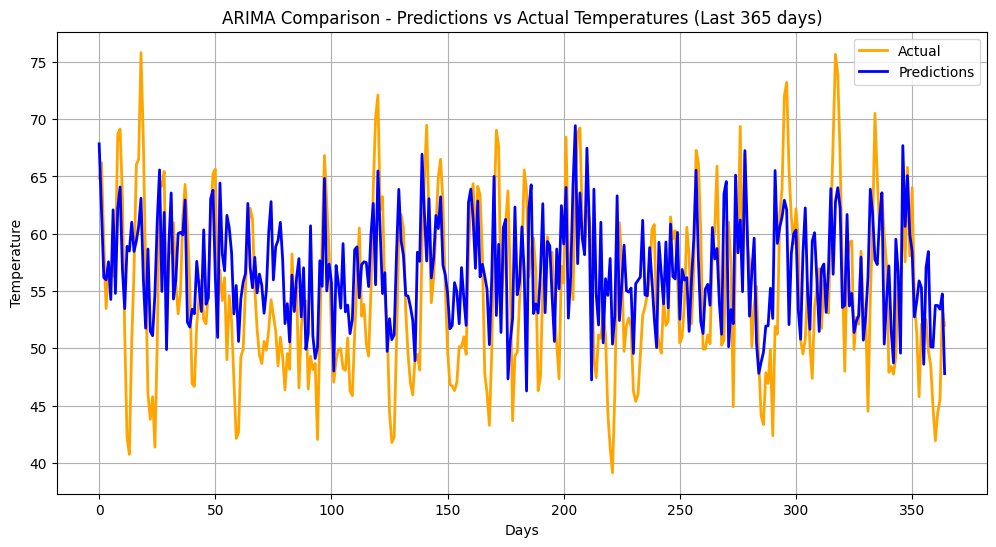

In [ ]:
import matplotlib.pyplot as plt

arima_last_365 = final_us[['Date', 'smoothed_temp', 'ARIMA_Predicted']].dropna().tail(365).copy()
arima_last_365.rename(columns={'smoothed_temp': 'Actual Temperature', 'ARIMA_Predicted': 'Predicted Temperature'}, inplace=True)
arima_last_365.reset_index(drop=True, inplace=True)

plt.figure(figsize=(12, 6))
plt.plot(arima_last_365['Actual Temperature'], label='Actual', color='orange', linewidth=2)
plt.plot(arima_last_365['Predicted Temperature'], label='Predictions', color='blue', linewidth=2)
plt.title("ARIMA Comparison - Predictions vs Actual Temperatures (Last 365 days)")
plt.xlabel("Days")
plt.ylabel("Temperature")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
merged_df=pd.read_csv("/content/drive/MyDrive/Final_Group2/error_summary_RF_XGB_LSTM.csv")
merged_df = merged_df.merge(arima_errors_df, on='City', how='left')

In [ ]:
merged_df.to_csv("/content/drive/MyDrive/Final_Group2/Errors_RF_XGB_LSTM_ARIMA.csv", index=False)


## RF, ARIMA, LSTM, XGBOOST ERRORS

In [ ]:
merged_df

,City,RF_RMSE,RF_MAE,RF_R2,location,coordinates,latitude,longitude,XGB_RMSE,XGB_MAE,XGB_R2,LSTM_RMSE,LSTM_MAE,LSTM_R2,ARIMA_RMSE,ARIMA_MAE,ARIMA_R2
0,Great Falls,2.613973,1.784451,0.973037,"Great Falls, USA","Great Falls, Cascade County, Montana, United S...",47.504885,-111.291890,4.582049,3.573113,0.917151,5.007314,3.943358,0.901059,6.568578,5.080767,0.829741
1,Helena,2.593784,1.744382,0.975120,"Helena, USA","Helena, Lewis and Clark County, Montana, Unite...",46.592742,-112.036277,4.402934,3.400936,0.928307,4.932271,3.907579,0.910033,6.699395,5.171609,0.834018
2,Rapid City,2.569448,1.740810,0.976427,"Rapid City, USA","Rapid City, Pennington County, South Dakota, U...",44.080604,-103.228023,4.348592,3.339703,0.932481,4.749680,3.706549,0.919451,6.770391,5.230974,0.836334
3,Billings,2.559343,1.754592,0.975971,"Billings, USA","Billings, Yellowstone County, Montana, United ...",45.787496,-108.496070,4.425960,3.450064,0.928140,4.555780,3.513722,0.923863,6.618087,5.106693,0.839329
4,Bismarck,2.496023,1.715541,0.979250,"Bismarck, USA","Bismarck, Burleigh County, North Dakota, Unite...",46.808327,-100.783739,4.105927,3.191845,0.943852,5.583526,4.438643,0.896168,6.434064,4.973505,0.862126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,Yuma,1.386741,1.071899,0.991528,"Yuma, USA","Yuma, Yuma County, Arizona, United States",32.723268,-114.617995,3.326617,2.609537,0.951245,6.955497,6.586236,0.786857,6.186373,4.783675,0.831389
150,Wilmington,1.383324,1.045512,0.992769,"Wilmington, USA","Wilmington, New Castle County, Delaware, Unite...",39.745947,-75.546589,3.513161,2.674826,0.953360,2.443638,1.992008,0.977435,6.741926,5.242208,0.828236
151,Harrisburg,1.365776,1.037733,0.993242,"Harrisburg, USA","Harrisburg, Dauphin County, Pennsylvania, Unit...",40.266311,-76.886112,3.561764,2.726591,0.954041,2.599796,2.100081,0.975514,6.860824,5.344398,0.829472
152,Daytona Beach,1.333458,1.016599,0.990808,"Daytona Beach, USA","Daytona Beach, Volusia County, Florida, United...",29.210815,-81.022833,3.494106,2.683557,0.936885,5.282587,4.836125,0.855738,6.366170,4.924599,0.790485


In [ ]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/Group2_final/Errors_RF_XGB_LSTM_ARIMA.csv")

model_mapping = {
    'RF': 'Random Forest',
    'XGB': 'XGBoost',
    'LSTM': 'LSTM',
    'ARIMA': 'ARIMA'
}

long_df = pd.wide_to_long(
    df,
    stubnames=['RF', 'XGB', 'LSTM', 'ARIMA'],
    i=['City', 'location', 'coordinates', 'latitude', 'longitude'],
    j='Metric',
    sep='_',
    suffix='(RMSE|MAE|R2)'
).reset_index()

long_df.rename(columns={
    'Metric': 'Metric',
    'RF': 'Value',
    'XGB': 'Value',
    'LSTM': 'Value',
    'ARIMA': 'Value'
}, inplace=True)

melted = pd.DataFrame()

for model in model_mapping:
    temp = df[['City', 'location', 'coordinates', 'latitude', 'longitude',
               f'{model}_RMSE', f'{model}_MAE', f'{model}_R2']].copy()
    temp['Model'] = model_mapping[model]
    temp.rename(columns={
        f'{model}_RMSE': 'RMSE',
        f'{model}_MAE': 'MAE',
        f'{model}_R2': 'R2'
    }, inplace=True)
    melted = pd.concat([melted, temp], ignore_index=True)

melted.to_csv("/content/drive/MyDrive/Final_Group2/Errors_for_Tableau.csv", index=False)
print("Reshaped file saved as Reshaped_Model_Errors_for_Tableau.csv")


Reshaped file saved as Reshaped_Model_Errors_for_Tableau.csv


In [ ]:
melted

,City,location,coordinates,latitude,longitude,RMSE,MAE,R2,Model
0,Great Falls,"Great Falls, USA","Great Falls, Cascade County, Montana, United S...",47.504885,-111.291890,2.613973,1.784451,0.973037,Random Forest
1,Helena,"Helena, USA","Helena, Lewis and Clark County, Montana, Unite...",46.592742,-112.036277,2.593784,1.744382,0.975120,Random Forest
2,Rapid City,"Rapid City, USA","Rapid City, Pennington County, South Dakota, U...",44.080604,-103.228023,2.569448,1.740810,0.976427,Random Forest
3,Billings,"Billings, USA","Billings, Yellowstone County, Montana, United ...",45.787496,-108.496070,2.559343,1.754592,0.975971,Random Forest
4,Bismarck,"Bismarck, USA","Bismarck, Burleigh County, North Dakota, Unite...",46.808327,-100.783739,2.496023,1.715541,0.979250,Random Forest
...,...,...,...,...,...,...,...,...,...
611,Yuma,"Yuma, USA","Yuma, Yuma County, Arizona, United States",32.723268,-114.617995,6.186373,4.783675,0.831389,ARIMA
612,Wilmington,"Wilmington, USA","Wilmington, New Castle County, Delaware, Unite...",39.745947,-75.546589,6.741926,5.242208,0.828236,ARIMA
613,Harrisburg,"Harrisburg, USA","Harrisburg, Dauphin County, Pennsylvania, Unit...",40.266311,-76.886112,6.860824,5.344398,0.829472,ARIMA
614,Daytona Beach,"Daytona Beach, USA","Daytona Beach, Volusia County, Florida, United...",29.210815,-81.022833,6.366170,4.924599,0.790485,ARIMA


## SARIMA(Monthly)

In [ ]:
final_us

,Region,Country,State,City,Month,Day,Year,AvgTemperature,Rolling_Avg,Season_Fall,Season_Spring,Season_Summer,Season_Winter,Temp_MinMax,Temp_Standardized,smoothed_temp,Rolling_7,Rolling_30,lag_1,lag_7,lag_30,rolling_7,rolling_30,day_of_week,day_of_year,week_of_year,State_Encoded,City_Encoded,RF_Predicted,XGBoost_Prediction,LSTM_Predicted_Scaled,LSTM_Predicted_Original,Date,ARIMA_Predicted
0,North America,US,Alabama,Birmingham,1,1,1995,50.7,50.700000,0,0,0,1,0.477064,-0.329234,50.700000,50.700000,50.700000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,1,14,50.890667,48.912310,-0.914446,41.961428,1995-01-01,58.999955
1,North America,US,New York,Syracuse,1,1,1995,35.2,42.116667,0,0,0,1,0.334862,-1.159258,42.950000,46.825000,46.825000,50.700000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,33,135,44.133500,42.398167,-0.914446,41.961428,1995-01-01,54.306666
2,North America,US,Tennessee,Knoxville,1,1,1995,47.6,59.250000,0,0,0,1,0.448624,-0.495239,44.500000,46.050000,46.050000,42.950000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,43,72,43.568000,41.088913,-0.914446,41.961428,1995-01-01,57.544800
3,North America,US,North Carolina,Asheville,1,1,1995,47.4,43.963333,0,0,0,1,0.446789,-0.505949,43.400000,45.387500,45.387500,44.500000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,7,43.334333,41.219246,-0.914446,41.961428,1995-01-01,56.331960
4,North America,US,North Carolina,Charlotte,1,1,1995,41.9,54.193333,0,0,0,1,0.396330,-0.800473,45.633333,45.436667,45.436667,43.400000,50.700000,50.700000,41.278571,35.600556,6.0,1.0,52.0,34,25,43.642333,42.068870,-0.914446,41.961428,1995-01-01,58.254466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427372,North America,US,Pennsylvania,Wilkes Barre,5,13,2020,40.6,47.183333,0,1,0,0,0.384404,-0.870088,41.933333,48.838095,54.706667,44.866667,45.766667,53.400000,48.838095,54.706667,2.0,134.0,20.0,39,149,45.544000,45.311490,-0.570134,47.558391,2020-05-13,53.738429
1427373,North America,US,Virginia,Richmond,5,13,2020,50.1,56.510000,0,1,0,0,0.471560,-0.361364,44.333333,47.728571,54.701111,41.933333,52.100000,44.500000,47.728571,54.701111,2.0,134.0,20.0,47,113,47.539667,46.162240,-0.626545,46.641399,2020-05-13,53.733512
1427374,North America,US,West Virginia,Charleston,5,13,2020,45.9,51.196667,0,1,0,0,0.433028,-0.586274,45.533333,46.785714,54.406667,44.333333,52.133333,54.366667,46.785714,54.406667,2.0,134.0,20.0,49,24,48.482000,47.343838,-0.482287,48.986383,2020-05-13,53.414827
1427375,North America,US,Alabama,Mobile,5,13,2020,64.2,66.986667,0,1,0,0,0.600917,0.393689,53.400000,46.914286,54.164444,45.533333,52.500000,60.666667,46.914286,54.164444,2.0,134.0,20.0,1,90,51.790000,52.614250,-0.358206,51.003379,2020-05-13,54.740010


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)


In [ ]:
final_us['Date'] = pd.to_datetime(final_us['Date'])

monthly_data = final_us.set_index('Date') \
    .groupby(['City', pd.Grouper(freq='M')])['smoothed_temp'] \
    .mean().reset_index()

In [ ]:
from pmdarima import auto_arima
from tqdm import tqdm

sarima_params = {}

for city in tqdm(monthly_data['City'].unique(), desc="Selecting SARIMA parameters"):
    city_series = monthly_data[monthly_data['City'] == city].set_index('Date')['smoothed_temp'].dropna()

    model = auto_arima(city_series,
                       start_p=0, start_q=0, max_p=4, max_q=4,
                       start_P=0, start_Q=0, max_P=4, max_Q=4,
                       d=None, D=None,
                       seasonal=True, m=12,
                       trace=False,
                       error_action='ignore',
                       suppress_warnings=True)

    sarima_params[city] = (model.order, model.seasonal_order)

print("SARIMA parameter selection completed for all cities.")


Selecting SARIMA parameters:   6%|▋         | 10/154 [05:36<1:05:46, 27.41s/it]/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:1908: RuntimeWarning:

divide by zero encountered in reciprocal

Selecting SARIMA parameters: 100%|██████████| 154/154 [2:02:02<00:00, 47.55s/it]

SARIMA parameter selection completed for all cities.


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

sarima_forecasts = {}

for city in tqdm(monthly_data['City'].unique(), desc="Training SARIMA models & forecasting"):
    city_series = monthly_data[monthly_data['City'] == city].set_index('Date')['smoothed_temp'].dropna()

    order, seasonal_order = sarima_params[city]
    model = SARIMAX(city_series, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit(disp=False)

    forecast_steps = 12
    forecast_values = model.forecast(steps=forecast_steps)

    forecast_df = pd.DataFrame({
        'Date': pd.date_range(start=city_series.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='M'),
        'SARIMA_Forecast1': forecast_values.values
    }).set_index('Date')

    sarima_forecasts[city] = forecast_df

print("SARIMA forecasts generated for all cities.")


Training SARIMA models & forecasting: 100%|██████████| 154/154 [02:17<00:00,  1.12it/s]

SARIMA forecasts generated for all cities.


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

sarima_error_summary = []

for city in tqdm(monthly_data['City'].unique(), desc="Calculating SARIMA error metrics"):
    city_series = monthly_data[monthly_data['City'] == city].set_index('Date')['smoothed_temp'].dropna()

    order, seasonal_order = sarima_params[city]
    model = SARIMAX(city_series, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False).fit(disp=False)

    preds = model.predict(start=0, end=len(city_series)-1)

    rmse = np.sqrt(mean_squared_error(city_series, preds))
    mae = mean_absolute_error(city_series, preds)
    r2 = r2_score(city_series, preds)

    sarima_error_summary.append({'City': city, 'RMSE': rmse, 'MAE': mae, 'R2': r2})

sarima_errors_df = pd.DataFrame(sarima_error_summary)
sarima_errors_df.sort_values(by='RMSE', inplace=True)
sarima_errors_df.to_csv('/content/drive/MyDrive/Final_Group2/sarima_error_summary_better_params.csv', index=False)
print("SARIMA error metrics calculated and saved.")


Calculating SARIMA error metrics: 100%|██████████| 154/154 [02:18<00:00,  1.11it/s]

SARIMA error metrics calculated and saved.


In [ ]:
overall_rmse = sarima_errors_df['RMSE'].mean()
overall_mae = sarima_errors_df['MAE'].mean()
overall_r2 = sarima_errors_df['R2'].mean()

print(f"Overall SARIMA Model Performance Across All Cities:")
print(f"Average RMSE: {overall_rmse:.4f}")
print(f"Average MAE: {overall_mae:.4f}")
print(f"Average R²: {overall_r2:.4f}")


Overall SARIMA Model Performance Across All Cities:
Average RMSE: 9.8122
Average MAE: 3.8574
Average R²: 0.4978


In [ ]:
import plotly.graph_objects as go

buttons = []
traces = []

for city_name, forecast in sarima_forecasts.items():
    actual_city_data = monthly_data[monthly_data['City'] == city_name].copy()
    actual_city_data.set_index('Date', inplace=True)
    actual_series = actual_city_data['smoothed_temp']

    last_actual_date = actual_series.index[-1]
    last_actual_value = actual_series.iloc[-1]

    forecast_with_continuity = pd.concat([
        pd.DataFrame({'SARIMA_Forecast1': [last_actual_value]}, index=[last_actual_date]),
        forecast
    ])

    traces.append(go.Scatter(x=actual_series.index, y=actual_series.values, mode='lines',
                             name=f'Actual - {city_name}', visible=False))

    traces.append(go.Scatter(x=forecast_with_continuity.index, y=forecast_with_continuity['SARIMA_Forecast1'],
                             mode='lines+markers', name=f'SARIMA Forecast - {city_name}',
                             line=dict(dash='dot'), visible=False))

for i, city_name in enumerate(sarima_forecasts.keys()):
    vis = [False] * (len(sarima_forecasts) * 2)
    vis[2 * i] = True
    vis[2 * i + 1] = True
    buttons.append(dict(method='update', label=city_name, args=[{'visible': vis}]))

fig = go.Figure(traces)
fig.update_layout(
    updatemenus=[dict(type='dropdown', direction='down', buttons=buttons)],
    title='Interactive City-Wise SARIMA Forecast',
    width=1500, height=650
)
fig.show()


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tqdm import tqdm
import numpy as np

# Initialize prediction column
monthly_data['SARIMA_Predicted'] = np.nan

# Set burn-in to ignore unstable early predictions
burn_in = 12  # number of months to skip from start of predictions

for city in tqdm(monthly_data['City'].unique(), desc="Adding SARIMA fitted predictions with burn-in"):
    try:
        # Get the time series for this city
        city_series = monthly_data[monthly_data['City'] == city].set_index('Date')['smoothed_temp'].dropna()

        # Get SARIMA order
        order, seasonal_order = sarima_params[city]

        # Train SARIMA model
        model = SARIMAX(city_series,
                        order=order,
                        seasonal_order=seasonal_order,
                        enforce_stationarity=False,
                        enforce_invertibility=False).fit(disp=False)

        # Get fitted predictions and apply burn-in
        preds = model.fittedvalues
        preds = preds.iloc[burn_in:]  # skip unstable early predictions

        # Only update rows where prediction exists
        mask = (monthly_data['City'] == city) & (monthly_data['Date'].isin(preds.index))
        monthly_data.loc[mask, 'SARIMA_Predicted'] = preds.values

    except Exception as e:
        print(f"Skipping {city} due to error: {e}")


Adding SARIMA fitted predictions with burn-in: 100%|██████████| 154/154 [02:18<00:00,  1.11it/s]


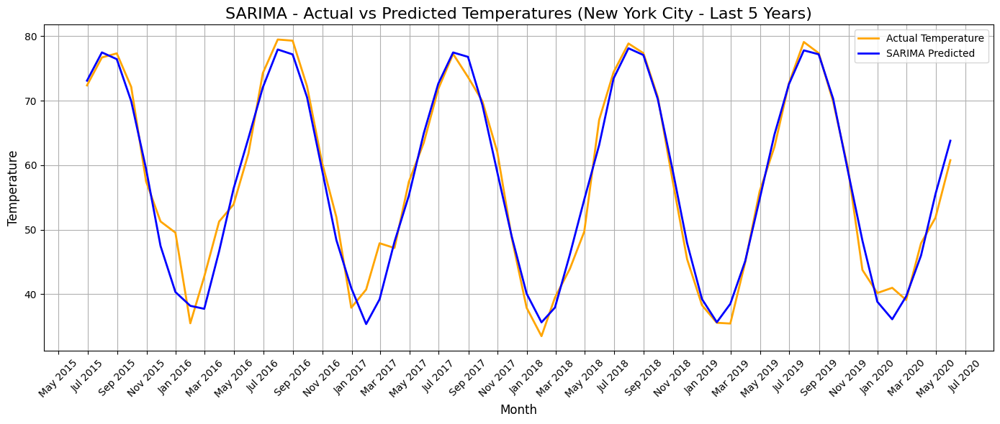

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

city_to_plot = "New York City"

city_df = monthly_data[monthly_data['City'] == city_to_plot].dropna(subset=['SARIMA_Predicted']).copy()
city_df['Date'] = pd.to_datetime(city_df['Date'])
city_df.set_index('Date', inplace=True)

city_df = city_df.tail(60)

plt.figure(figsize=(14, 6))
plt.plot(city_df.index, city_df['smoothed_temp'], label="Actual Temperature", color='orange', linewidth=2)
plt.plot(city_df.index, city_df['SARIMA_Predicted'], label="SARIMA Predicted", color='blue', linewidth=2)

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))

plt.title(f"SARIMA - Actual vs Predicted Temperatures ({city_to_plot} - Last 5 Years)", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Temperature", fontsize=12)
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


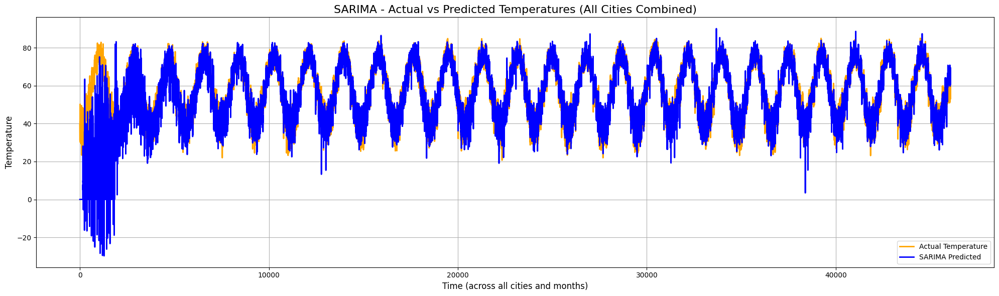

In [ ]:
import matplotlib.pyplot as plt

df_all = monthly_data.dropna(subset=['SARIMA_Predicted']).copy()

df_all.sort_values(by='Date', inplace=True)

plt.figure(figsize=(20, 6))
plt.plot(df_all['smoothed_temp'].values, label='Actual Temperature', color='orange', linewidth=2)
plt.plot(df_all['SARIMA_Predicted'].values, label='SARIMA Predicted', color='blue', linewidth=2)

plt.title("SARIMA - Actual vs Predicted Temperatures (All Cities Combined)", fontsize=16)
plt.xlabel("Time (across all cities and months)", fontsize=12)
plt.ylabel("Temperature", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
